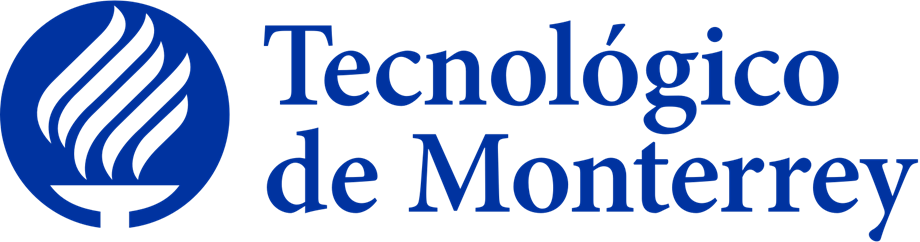

# **Instituto Tecnológico y de Estudios Superiores de Monterrey**

## **Escuela de Ingeniería y Ciencias**

## **Maestría en Inteligencia Artificial Aplicada**

### **Dra. Grettel Barceló Alonso**

### **Dr. Luis Eduardo Falcón Morales**

**Materia Proyecto integrador**

**Análisis exploratorio de datos**

**Equipo 11**

**José Gilberto Amaro Aceves - A01794815**

**Francisco Antonio Enríquez Cabrera - A01795006**

**Carlos Eduardo García García - A01795206**  

**Fecha:  04-05-2025**



<h3 style="color:red">  El contenido está estructurado como: <br> 1. Código usado para la libreta <br> 2. Reporte del EDA </h3>


**Si desea ver el contenido estructurado de una mejor manera se cuenta con un documento de word y PDF con el mismo contenido mostrado aqui**

# 1. Código usado para la exploración de datos

### Importación de librerias

In [15]:
from __future__ import annotations

from pathlib import Path

from typing import List, Tuple
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import matplotlib.dates as mdates

### Configuraciones

In [16]:
# Configuración global
from pandas.api.types import CategoricalDtype
sns.set_theme(style="whitegrid")
plt.rcParams["figure.dpi"] = 110

# Montar drive y fija la ruta base
from google.colab import drive
drive.mount('/content/drive')

BASE_PATH  = Path("/content/drive/MyDrive/ProyectoIntegrador/ModeloPronosticos/data")
CLEAN_PATH = BASE_PATH / "cleaned"
CLEAN_PATH.mkdir(parents=True, exist_ok=True)

MISSING_COL_THRESHOLD = 0.30   # descartar columnas con >30 % de nulos
HIGH_CARDINALITY_K    = 20     # top-k categorías a conservar
HIGH_CORR_THRESHOLD   = 0.90   # |ρ| crítico para multicolinealidad
LOW_VAR_THRESHOLD     = 1e-4   # varianza ~0

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Preprocesamiento

In [17]:
# Utilidades de pre-procesamiento
def imputar_nulos(df: pd.DataFrame) -> pd.DataFrame:
    """Imputa nulos (numéricas → mediana, categóricas → moda)."""
    df = df.copy()
    num = df.select_dtypes("number").columns
    cat = df.select_dtypes(include=["object", "category"]).columns
    if num.any():
        df[num] = df[num].fillna(df[num].median())
    if cat.any():
        df[cat] = df[cat].apply(lambda s: s.fillna(s.mode().iloc[0]))
    return df

In [18]:
# Winsorización de outliers
def winsorizar_outliers(df: pd.DataFrame) -> pd.DataFrame:
    """Corta valores fuera de 1.5·IQR (excepto Year, Mes, AnioArchivo)."""
    df = df.copy()
    num = [c for c in df.select_dtypes("number")
           if c.lower() not in {"year", "mes", "anioarchivo", "añoarchivo"}]
    if not num:
        return df
    q1 = df[num].quantile(.25)
    q3 = df[num].quantile(.75)
    iqr = q3 - q1
    df[num] = df[num].clip(lower=q1 - 1.5 * iqr, upper=q3 + 1.5 * iqr, axis=1)
    return df

In [19]:
# Reducción de cardinalidad
def reducir_cardinalidad(df: pd.DataFrame,
                         k: int = HIGH_CARDINALITY_K) -> pd.DataFrame:
    """Agrupa categorías poco frecuentes en «OTROS» (sólo top-k)."""
    df = df.copy()

    for col in df.select_dtypes(include=["object", "category"]):
        if df[col].nunique() > k:
            top_k = df[col].value_counts().nlargest(k).index

            # Añade la categoría «OTROS» si la serie ya es Categorical
            if isinstance(df[col].dtype, CategoricalDtype) and "OTROS" not in df[col].cat.categories:
              df[col] = df[col].cat.add_categories(["OTROS"])

            df[col] = df[col].where(df[col].isin(top_k), "OTROS")

    return df

In [20]:
# Corrección de sesgo
def transformar_sesgo(df: pd.DataFrame) -> pd.DataFrame:
    """Aplica log10 a numéricas con |skew| > 1 (todas > 0)."""
    df = df.copy()
    num = df.select_dtypes("number")
    sesgadas = [c for c in num if abs(num[c].skew()) > 1 and (num[c] > 0).all()]
    if sesgadas:
        df[sesgadas] = np.log10(df[sesgadas] + 1e-9)
    return df

In [21]:
# Seleccionar features
def seleccionar_features(df: pd.DataFrame) -> List[str]:
    """Devuelve lista de columnas tras quitar varianza~0 y ρ > 0.90."""
    df_num = df.select_dtypes("number")
    df_num = df_num.loc[:, df_num.var() > LOW_VAR_THRESHOLD]

    corr   = df_num.corr().abs()
    upper  = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
    drop   = [c for c in upper.columns if (upper[c] > HIGH_CORR_THRESHOLD).any()]

    return (df_num.columns.difference(drop).tolist() +
            df.select_dtypes(include=["object", "category"]).columns.tolist())

### Código para graficado general

In [22]:
# Visualización & diagnóstico
def plot_hist_box(df: pd.DataFrame, col: str, title: str, *, show=True) -> None:
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))
    sns.histplot(df[col], kde=True, ax=ax[0]); ax[0].set_title(f"Hist – {title}")
    sns.boxplot(x=df[col], ax=ax[1]);          ax[1].set_title("Box-plot")
    plt.tight_layout()
    if show:
        plt.show()
    else:
        plt.close(fig)

In [23]:
# Gráfica de tendencia temporal
def tendencia_temporal(df: pd.DataFrame, fecha: str, y: str, title: str,
                       *, show=True) -> None:
    grp = df.groupby(fecha)[y].sum().reset_index()
    fig = plt.figure(figsize=(12, 4))
    sns.lineplot(data=grp, x=fecha, y=y)
    plt.title(title); plt.xticks(rotation=45); plt.tight_layout()
    if show:
        plt.show()
    else:
        plt.close(fig)

In [24]:
# Matriz de correlación
def matriz_correlacion(df: pd.DataFrame, cols: List[str], *, show=True) -> None:
    fig = plt.figure(figsize=(6, 5))
    sns.heatmap(df[cols].corr(), annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Mapa de correlaciones"); plt.tight_layout()
    if show:
        plt.show()
    else:
        plt.close(fig)

### Pipeline de EDA

In [25]:
# Pipeline de EDA
def eda_completo(df: pd.DataFrame,
                 nombre: str,
                 fecha_col: str | None = None,
                 valor_col: str | None = None,
                 *,
                 plot: bool = True) -> Tuple[pd.DataFrame, List[str]]:
    """
    ▸ Diagnóstico + visualizaciones · ▸ Pre-procesamiento · ▸ Selección de
    variables · ▸ Exportación de artefactos.  Devuelve (df_limpio, features).
    """
    print(f"\n{'='*10} EDA – {nombre} {'='*10}\nForma inicial:", df.shape)
    # Agrupar categorías idénticas (cosmético)
    print(df.dtypes.apply(str).value_counts().sort_index())

    # Nulos
    nulls = df.isna().mean()
    print("\n% nulos por columna:\n", (nulls * 100).round(2))
    if plot and nulls.any():
        sns.heatmap(df.isna(), cbar=False)
        plt.title("Mapa de valores faltantes"); plt.tight_layout(); plt.show()

    # Desequilibrio categórico
    cat_cols = df.select_dtypes(include=["object", "category"]).columns
    for col in cat_cols:
        ratio = df[col].value_counts(normalize=True).iloc[0]
        print(f"Max proporción en {col}: {ratio:.2%}")

    # Stats
    try:
        desc = df.describe(include="all", datetime_is_numeric=True)
    except TypeError:                      # pandas < 1.5
        desc = df.describe(include="all")
    print("\nResumen descriptivo:\n", desc)

    if cat_cols.any():
        print("\nCardinalidad categóricas:\n", df[cat_cols].nunique())
        if plot:
            for col in cat_cols:
                df[col].value_counts().head(20).plot(kind="bar", figsize=(8, 4))
                plt.title(f"Frecuencia {col}")
                plt.show()

    # Plots numéricos
    if plot and valor_col in df.columns:
        plot_hist_box(df, valor_col, valor_col)
    if plot and fecha_col and valor_col and fecha_col in df.columns:
        tendencia_temporal(df, fecha_col, valor_col,
                           f"Tendencia temporal {valor_col}")

    num_cols = df.select_dtypes("number").columns
    if plot and len(num_cols) >= 2:
        matriz_correlacion(df, list(num_cols))

    # ── Pre-procesamiento
    df_clean = df.copy()
    if nulls.gt(MISSING_COL_THRESHOLD).any():
        drop_cols = nulls[nulls > MISSING_COL_THRESHOLD].index
        print("\nEliminando columnas con >30 % nulos:", list(drop_cols))
        df_clean.drop(columns=drop_cols, inplace=True)

    df_clean = (df_clean
                .pipe(imputar_nulos)
                .pipe(winsorizar_outliers)
                .pipe(reducir_cardinalidad)
                .pipe(transformar_sesgo))

    # Selección de variables
    selected = seleccionar_features(df_clean)
    print(f"\nVariables retenidas ({len(selected)}):\n", selected)

    # Guardar artefactos
    CLEAN_PATH.mkdir(exist_ok=True)
    out_file = CLEAN_PATH / f"{nombre.replace(' ','_').lower()}_clean.csv"
    df_clean.to_csv(out_file, index=False)
    print("Dataset limpio guardado en:", out_file.relative_to(BASE_PATH.parent))

    print("\nConclusiones:",
          f"\n- Filas tras limpieza: {df_clean.shape[0]}",
          f"\n- Numéricas: {len(df_clean.select_dtypes('number').columns)}",
          f"\n- Categóricas: {len(df_clean.select_dtypes(include=['object', 'category']).columns)}",
          sep=" ")

    return df_clean, selected

In [26]:
#Función principal
def main(plot: bool = True) -> None:
    """Ejecuta el pipeline EDA sobre cada uno de los archivos CRT."""
    files = {
        "Exportaciones Total Forma"   : "consolidado_exportacionestotalforma.csv",
        "Exportaciones Total Categoría": "consolidado_exportacionestotalcategoria.csv",
        "Producción Total Tequila"    : "consolidado_producciontotaltequila.csv",
        "Consumo de Agave Total"      : "consolidado_consumodeagavetotal.csv",
        "Exportaciones País"          : "consolidado_exportaciones_pais.csv",
    }

    for nombre, fname in files.items():
        df = pd.read_csv(BASE_PATH / fname)

        # Normalizar nombre Año → AnioArchivo
        df.rename(columns={"AñoArchivo": "AnioArchivo",
                           "A\u00F1oArchivo": "AnioArchivo"}, inplace=True)

        # Filtrar duplicados “Total”
        if "SubCategoria" in df.columns:
            df = df[~df["SubCategoria"].str.contains("total", case=False)]

        # Convertir categóricas a dtype category (ahorra RAM)
        cat_cols = df.select_dtypes("object").columns
        df[cat_cols] = df[cat_cols].astype("category")

        # Crear columna Fecha y determinar métrica
        fecha_col, valor_col = None, None
        if {"AnioArchivo", "Mes"}.issubset(df.columns):
            df = df.assign(
                Fecha=pd.to_datetime(
                    {"year": df["AnioArchivo"], "month": df["Mes"], "day": 1})
            )
            fecha_col = "Fecha"

        valor_col = "Valor" if "Valor" in df.columns else "Total_Pais_Mes"

        eda_completo(df, nombre, fecha_col, valor_col, plot=plot)


========== EDA – Exportaciones Total Forma ==========
Forma inicial: (726, 6)
category          1
datetime64[ns]    1
float64           1
int64             3
Name: count, dtype: int64

% nulos por columna:
 SubCategoria    0.0
Year            0.0
Valor           0.0
AnioArchivo     0.0
Mes             0.0
Fecha           0.0
dtype: float64
Max proporción en SubCategoria: 50.00%

Resumen descriptivo:
        SubCategoria         Year       Valor  AnioArchivo         Mes  \
count           726   726.000000  726.000000   726.000000  726.000000   
unique            2          NaN         NaN          NaN         NaN   
top        Envasado          NaN         NaN          NaN         NaN   
freq            363          NaN         NaN          NaN         NaN   
mean            NaN  2009.628099    7.431956  2009.628099    6.462810   
min             NaN  1995.000000    0.400000  1995.000000    1.000000   
25%             NaN  2002.000000    4.500000  2002.000000    3.000000   
50%        

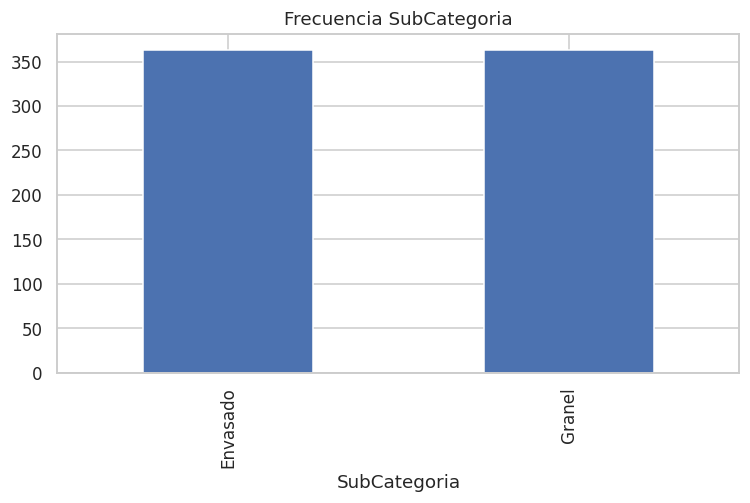

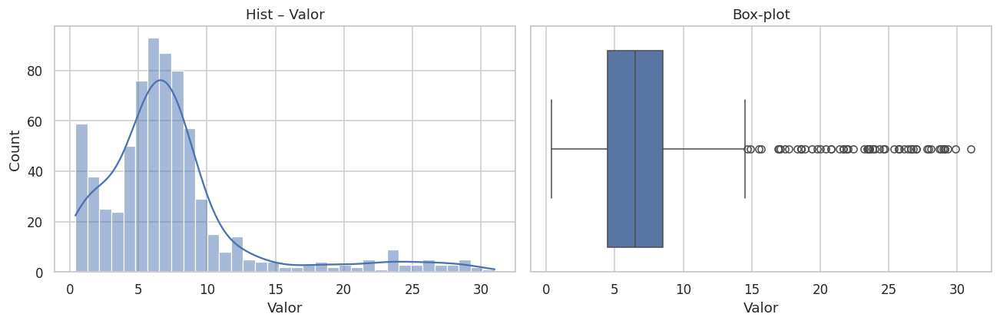

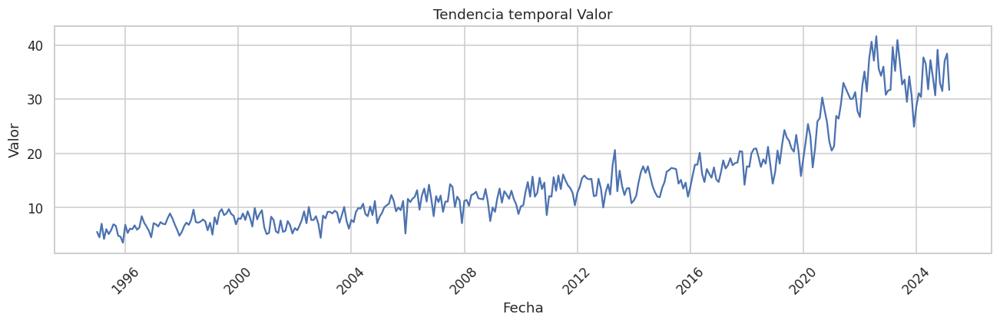

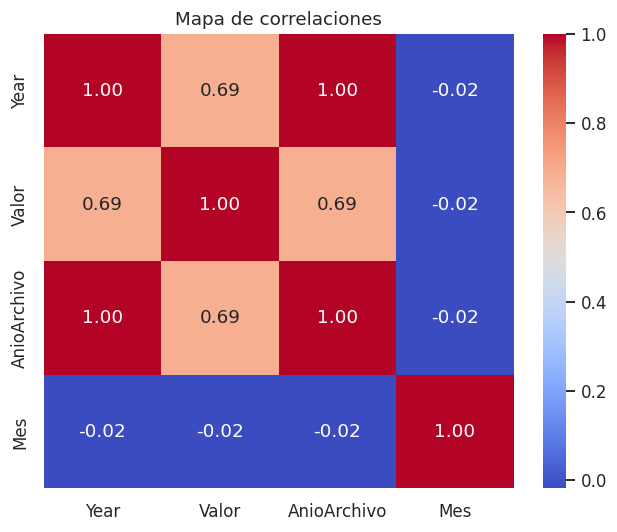


Variables retenidas (4):
 ['Mes', 'Valor', 'Year', 'SubCategoria']
Dataset limpio guardado en: data/cleaned/exportaciones_total_forma_clean.csv

Conclusiones: 
- Filas tras limpieza: 726 
- Numéricas: 4 
- Categóricas: 1

========== EDA – Exportaciones Total Categoría ==========
Forma inicial: (726, 6)
category          1
datetime64[ns]    1
float64           1
int64             3
Name: count, dtype: int64

% nulos por columna:
 SubCategoria    0.0
Year            0.0
Valor           0.0
AnioArchivo     0.0
Mes             0.0
Fecha           0.0
dtype: float64
Max proporción en SubCategoria: 50.00%

Resumen descriptivo:
        SubCategoria         Year       Valor  AnioArchivo         Mes  \
count           726   726.000000  726.000000   726.000000  726.000000   
unique            2          NaN         NaN          NaN         NaN   
top         Tequila          NaN         NaN          NaN         NaN   
freq            363          NaN         NaN          NaN         NaN   
mean

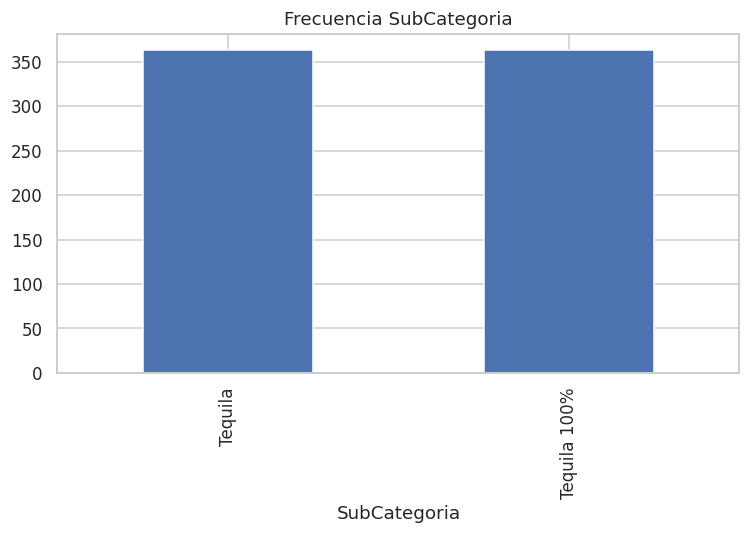

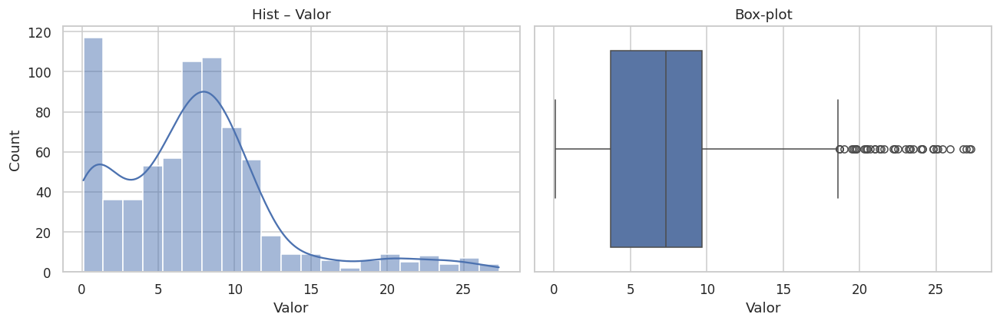

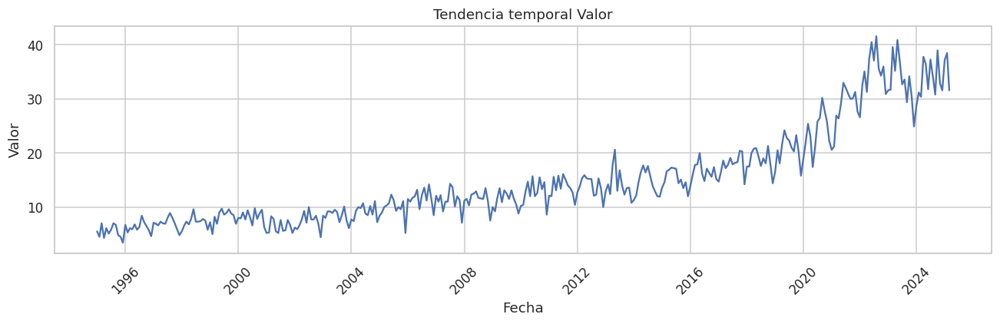

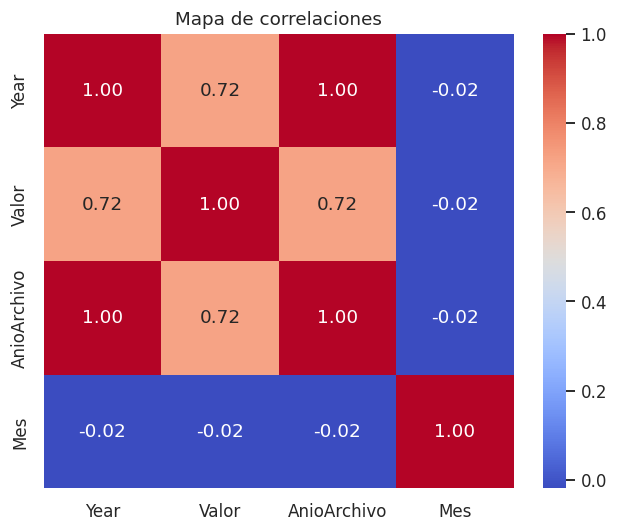


Variables retenidas (4):
 ['Mes', 'Valor', 'Year', 'SubCategoria']
Dataset limpio guardado en: data/cleaned/exportaciones_total_categoría_clean.csv

Conclusiones: 
- Filas tras limpieza: 726 
- Numéricas: 4 
- Categóricas: 1

========== EDA – Producción Total Tequila ==========
Forma inicial: (724, 6)
category          1
datetime64[ns]    1
float64           1
int64             3
Name: count, dtype: int64

% nulos por columna:
 SubCategoria    0.0
Year            0.0
Valor           0.0
AnioArchivo     0.0
Mes             0.0
Fecha           0.0
dtype: float64
Max proporción en SubCategoria: 50.00%

Resumen descriptivo:
        SubCategoria         Year       Valor  AnioArchivo         Mes  \
count           724   724.000000  724.000000   724.000000  724.000000   
unique            2          NaN         NaN          NaN         NaN   
top         Tequila          NaN         NaN          NaN         NaN   
freq            362          NaN         NaN          NaN         NaN   
mean 

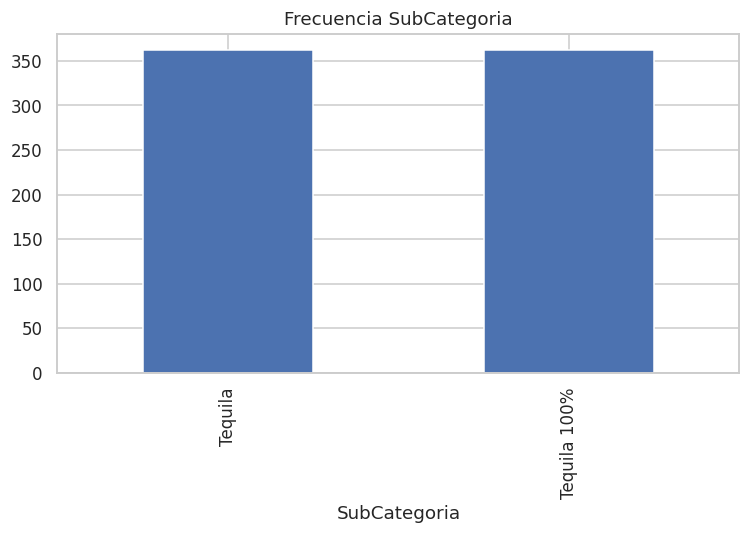

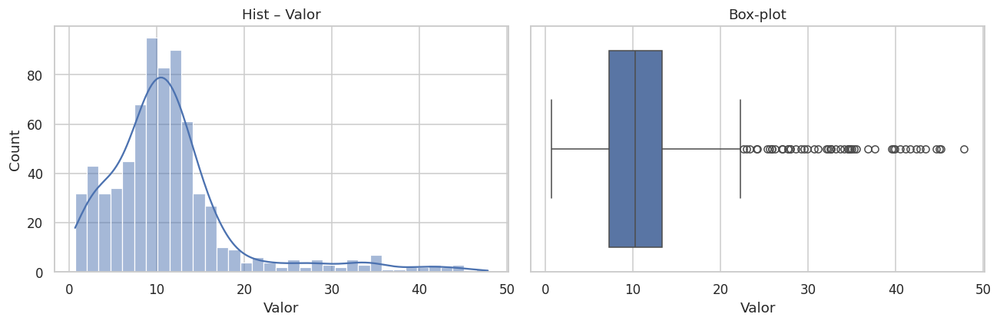

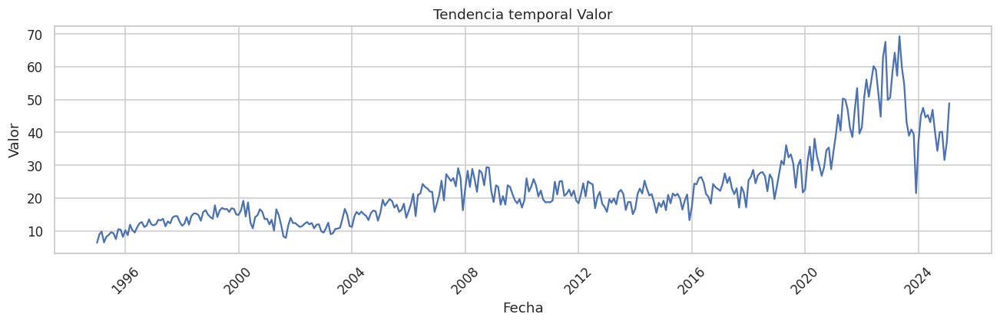

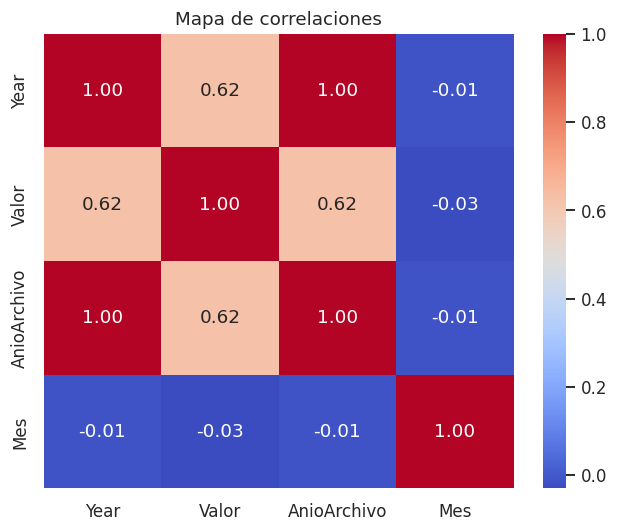


Variables retenidas (4):
 ['Mes', 'Valor', 'Year', 'SubCategoria']
Dataset limpio guardado en: data/cleaned/producción_total_tequila_clean.csv

Conclusiones: 
- Filas tras limpieza: 724 
- Numéricas: 4 
- Categóricas: 1

========== EDA – Consumo de Agave Total ==========
Forma inicial: (724, 6)
category          1
datetime64[ns]    1
float64           1
int64             3
Name: count, dtype: int64

% nulos por columna:
 SubCategoria    0.0
Year            0.0
Valor           0.0
AnioArchivo     0.0
Mes             0.0
Fecha           0.0
dtype: float64
Max proporción en SubCategoria: 50.00%

Resumen descriptivo:
        SubCategoria         Year       Valor  AnioArchivo         Mes  \
count           724   724.000000  724.000000   724.000000  724.000000   
unique            2          NaN         NaN          NaN         NaN   
top         Tequila          NaN         NaN          NaN         NaN   
freq            362          NaN         NaN          NaN         NaN   
mean        

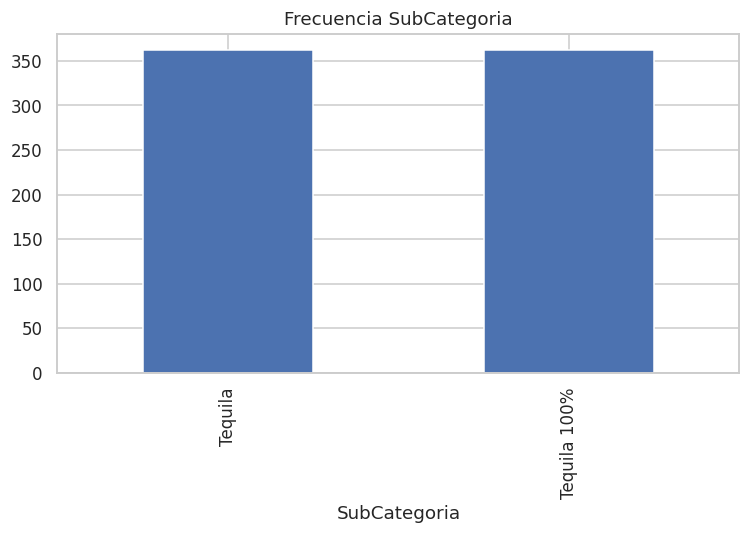

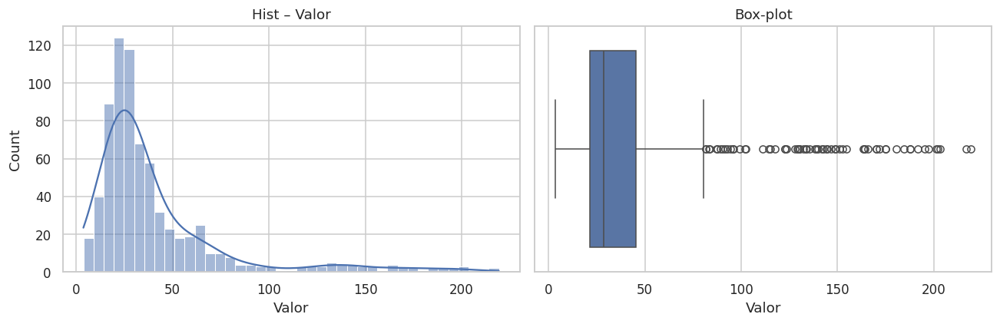

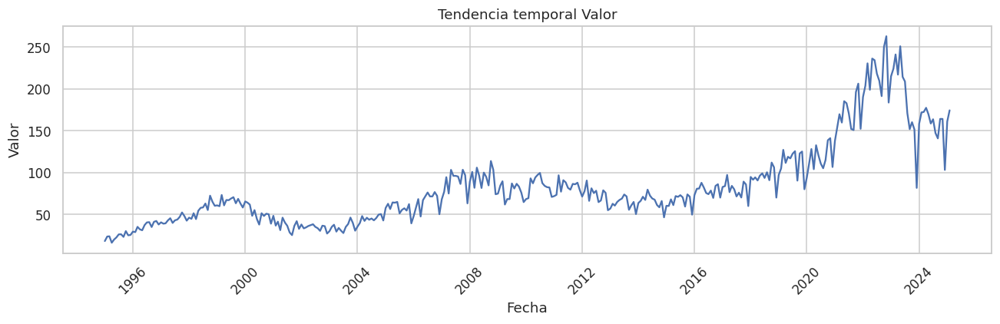

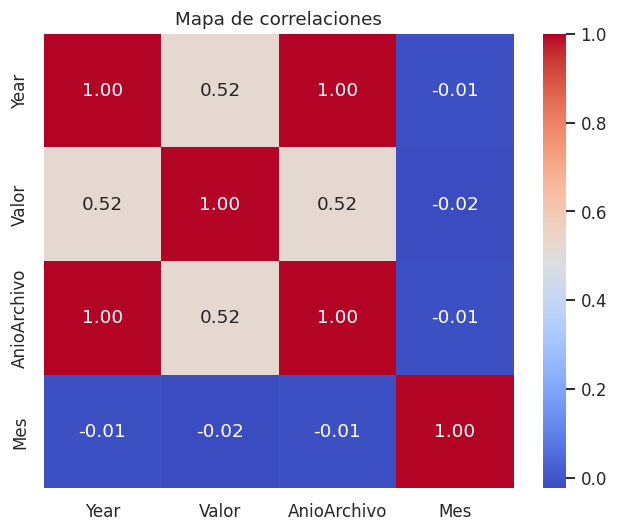


Variables retenidas (4):
 ['Mes', 'Valor', 'Year', 'SubCategoria']
Dataset limpio guardado en: data/cleaned/consumo_de_agave_total_clean.csv

Conclusiones: 
- Filas tras limpieza: 724 
- Numéricas: 4 
- Categóricas: 1

========== EDA – Exportaciones País ==========
Forma inicial: (64281, 9)
category          3
datetime64[ns]    1
float64           3
int64             2
Name: count, dtype: int64

% nulos por columna:
 NombrePais              0.0
Total_Pais_Mes          0.0
Categoria               0.0
Total_Categoria_Mes     0.0
Clase                   0.0
Litros 40 % Alc. Vol    0.0
AnioArchivo             0.0
Mes                     0.0
Fecha                   0.0
dtype: float64
Max proporción en NombrePais: 4.33%
Max proporción en Categoria: 50.22%
Max proporción en Clase: 33.40%

Resumen descriptivo:
                        NombrePais  Total_Pais_Mes              Categoria  \
count                       64281    6.428100e+04                  64281   
unique                        14

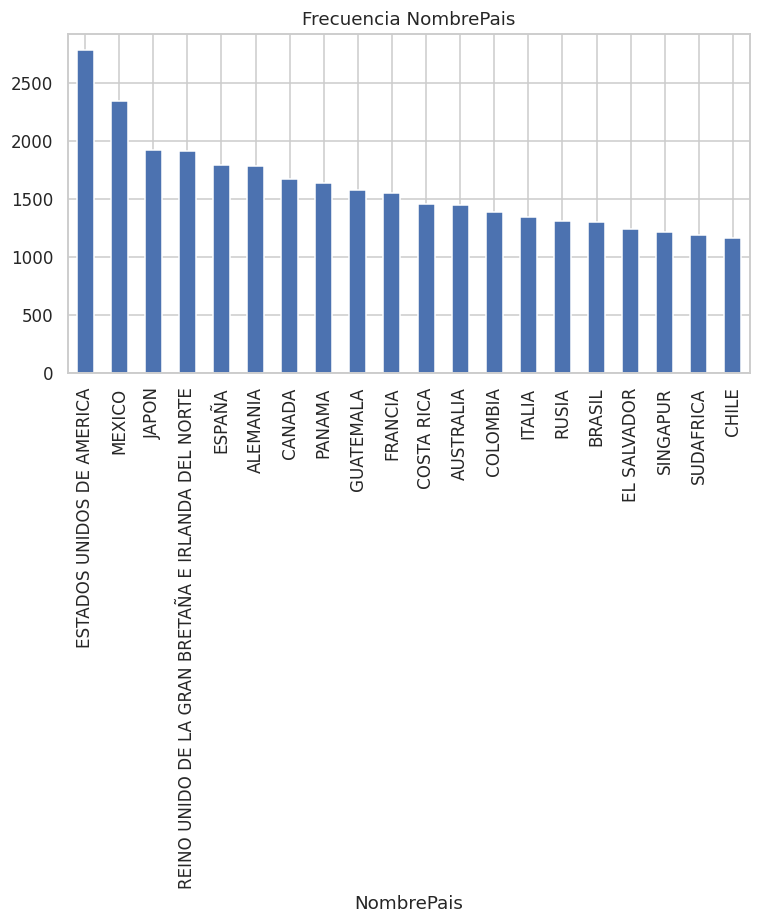

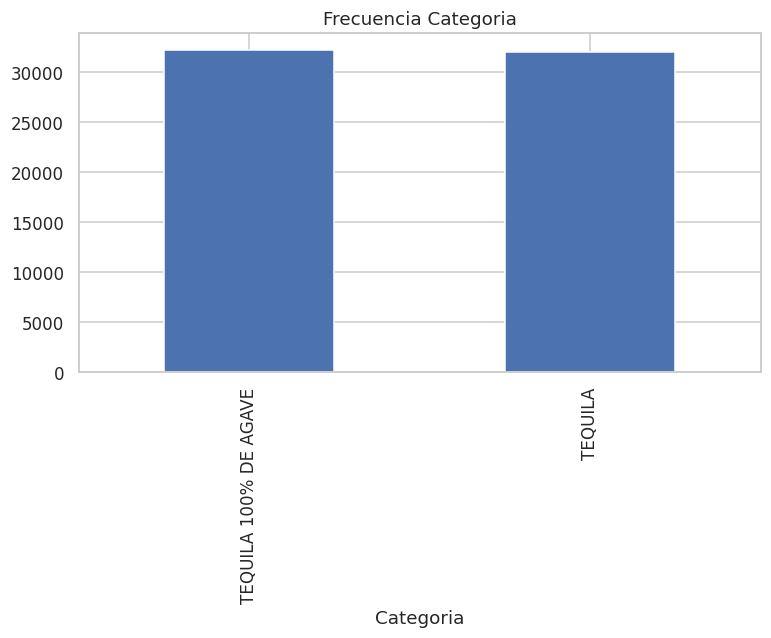

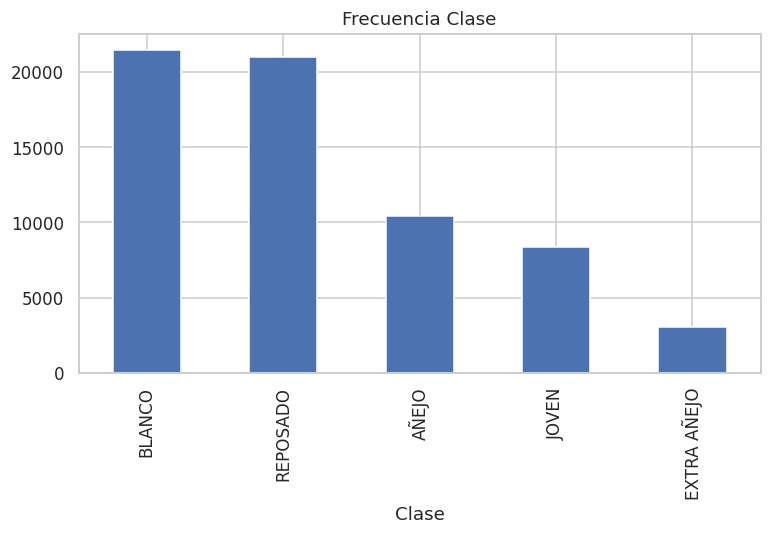

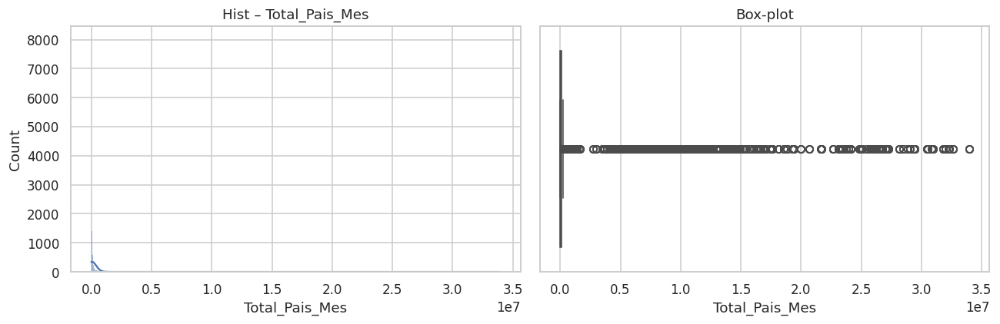

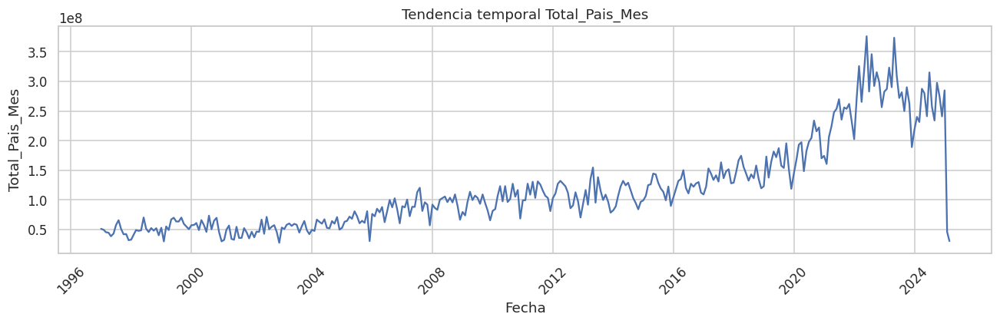

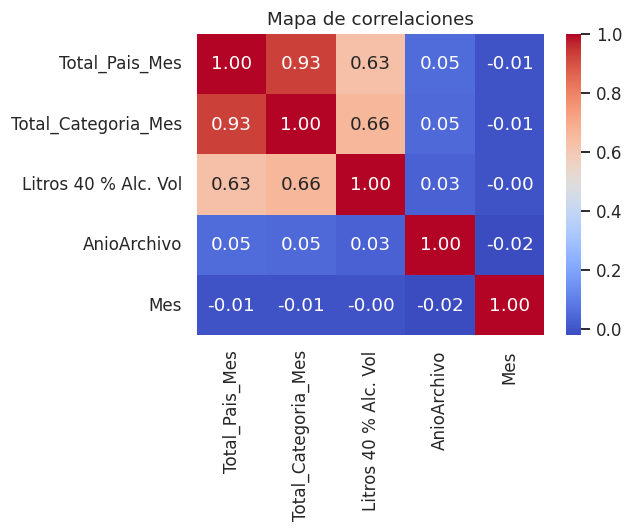


Variables retenidas (8):
 ['Total_Pais_Mes', 'Total_Categoria_Mes', 'Litros 40 % Alc. Vol', 'AnioArchivo', 'Mes', 'NombrePais', 'Categoria', 'Clase']
Dataset limpio guardado en: data/cleaned/exportaciones_país_clean.csv

Conclusiones: 
- Filas tras limpieza: 64281 
- Numéricas: 5 
- Categóricas: 3


In [27]:
if __name__ == "__main__":
    main(plot=True)

## Exportaciones totales por categoría

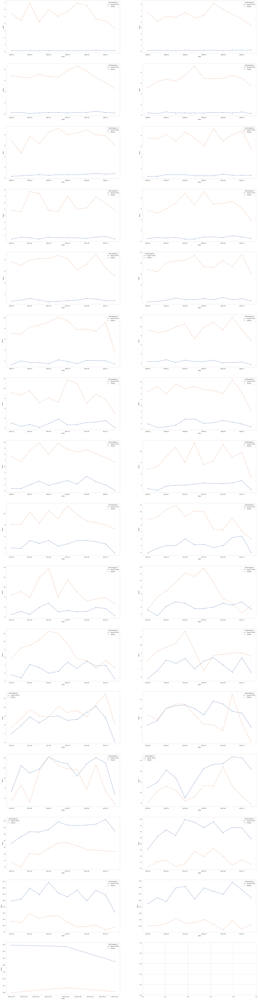

In [28]:
exportaciones_cat_df = pd.read_csv(BASE_PATH / "consolidado_exportacionestotalcategoria.csv")
exportaciones_cat_df["date"] = exportaciones_cat_df["Year"].astype(str) + "-" + exportaciones_cat_df["Mes"].astype(str) + "-1"
exportaciones_cat_df["date"] = exportaciones_cat_df["date"].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d'))
exportaciones_cat_df["month"] = exportaciones_cat_df["date"].map(lambda x: x.strftime("%b"))

dfWithoutTotals = exportaciones_cat_df[exportaciones_cat_df["SubCategoria"] != "Total"]

cols = dfWithoutTotals["Year"].unique().tolist()
totalPlotColumns = 2
totalPlotRows = math.ceil(len(cols) / totalPlotColumns)
i = 0
j = 0
fig, axes = plt.subplots(totalPlotRows, totalPlotColumns, figsize=(20 * totalPlotColumns, 10 * totalPlotRows))

for indx, year in enumerate(cols):
    i = math.floor(((indx) / totalPlotColumns))
    j = indx % totalPlotColumns
    sns.lineplot(data=dfWithoutTotals[dfWithoutTotals["Year"] == year], x="date", y="Valor", hue="SubCategoria", style="SubCategoria", markers=True, ax=axes[i, j])
    loc = mdates.AutoDateLocator()
    axes[i, j].xaxis.set_major_locator(loc)
    axes[i, j].xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
    axes[i, j].grid()

## Historial de exportaciones de tequila a estados unidos

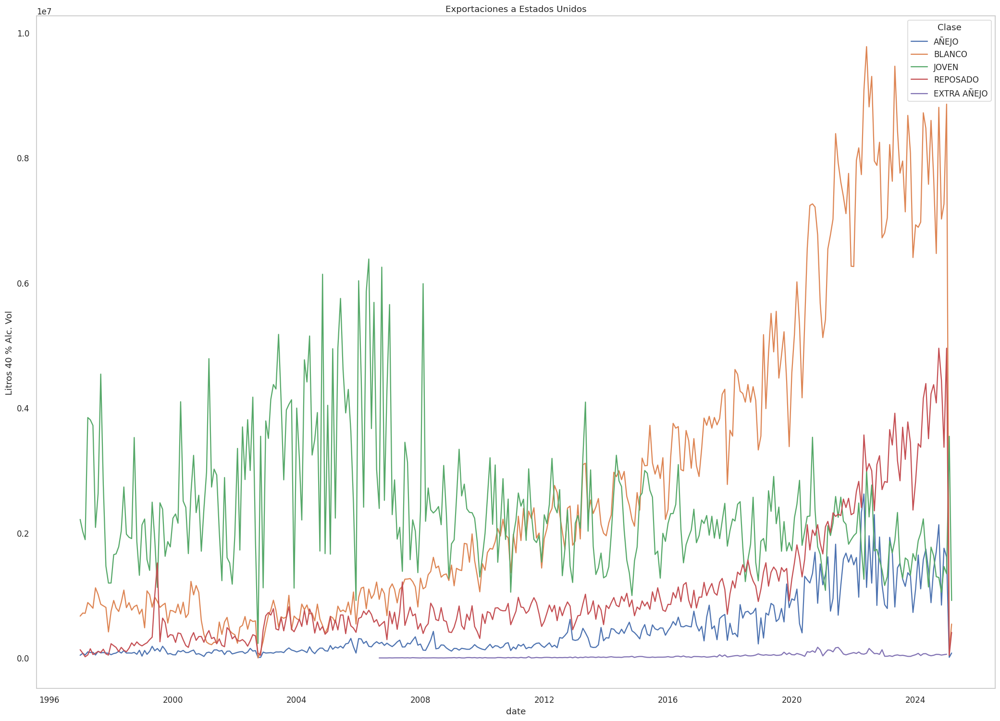

In [29]:
exportaciones_df = pd.read_csv(BASE_PATH / "consolidado_exportaciones_pais.csv")

exportaciones_df["date"] = exportaciones_df["AñoArchivo"].astype(str) + "-" + exportaciones_df["Mes"].astype(str) + "-1"
exportaciones_df["date"] = exportaciones_df["date"].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d'))


dfWithoutTotals = exportaciones_df[(exportaciones_df["Categoria"] != "Total") & (exportaciones_df["NombrePais"] == "ESTADOS UNIDOS DE AMERICA")]

plt.figure(figsize=(11.7 * 2, 8.27 * 2))
plt.title('Exportaciones por subcategoría')

ax = sns.lineplot(data=dfWithoutTotals, x="date", y="Litros 40 % Alc. Vol", hue="Clase", errorbar=None)
loc = mdates.AutoDateLocator()
ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
ax.grid()
ax.set_title("Exportaciones a Estados Unidos")

plt.show()


## Exportaciones por categoría

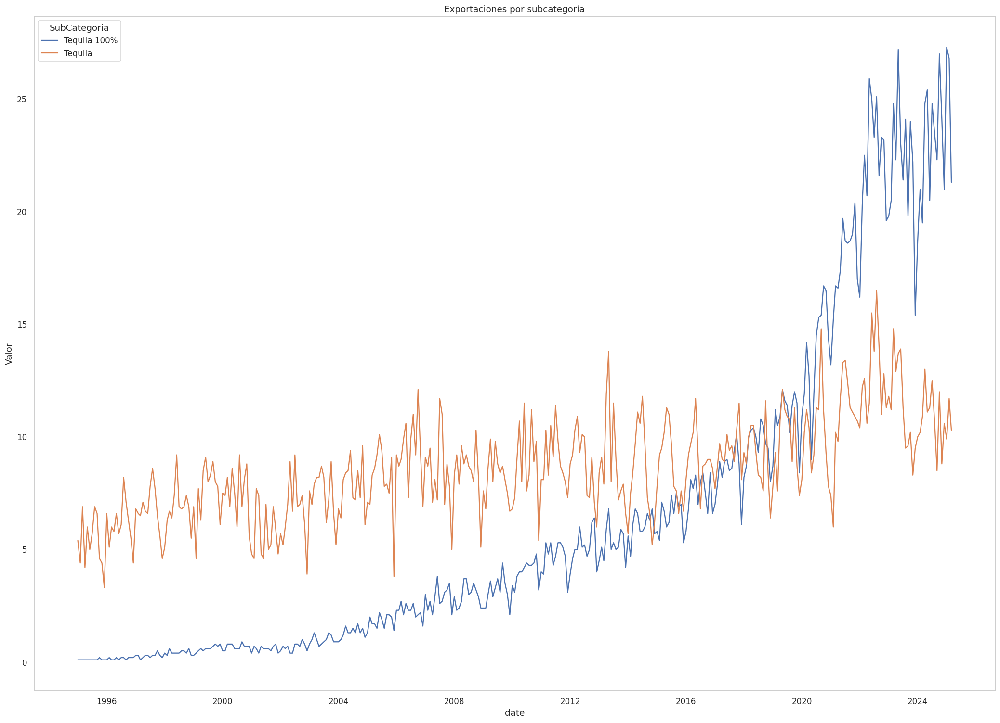

In [30]:
exportaciones_cat_df = pd.read_csv(BASE_PATH / "consolidado_exportacionestotalcategoria.csv")

exportaciones_cat_df["date"] = exportaciones_cat_df["AñoArchivo"].astype(str) + "-" + exportaciones_cat_df["Mes"].astype(str) + "-1"
exportaciones_cat_df["date"] = exportaciones_cat_df["date"].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d'))

plt.figure(figsize=(11.7 * 2, 8.27 * 2))
plt.title('Exportaciones por subcategoría')

loc = mdates.AutoDateLocator()
ax = sns.lineplot(data=exportaciones_cat_df[exportaciones_cat_df["SubCategoria"] != "Total"], x="date", y="Valor", hue="SubCategoria")
ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
ax.grid()

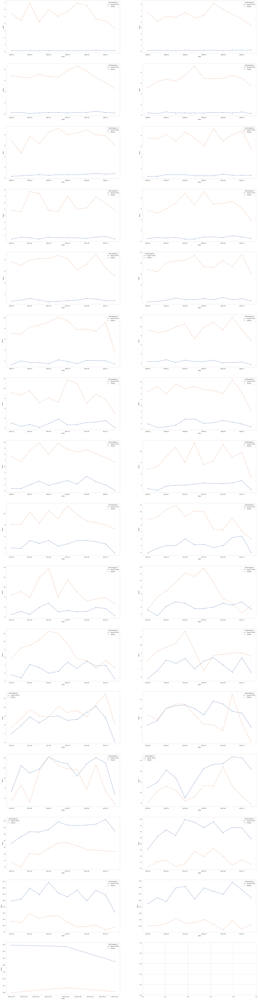

In [31]:
dfWithoutTotals = exportaciones_cat_df[exportaciones_cat_df["SubCategoria"] != "Total"]

cols = dfWithoutTotals["Year"].unique().tolist()
totalPlotColumns = 2
totalPlotRows = math.ceil(len(cols) / totalPlotColumns)
i = 0
j = 0
fig, axes = plt.subplots(totalPlotRows, totalPlotColumns, figsize=(20 * totalPlotColumns, 10 * totalPlotRows))

for indx, year in enumerate(cols):
    i = math.floor(((indx) / totalPlotColumns))
    j = indx % totalPlotColumns
    sns.lineplot(data=dfWithoutTotals[dfWithoutTotals["Year"] == year], x="date", y="Valor", hue="SubCategoria", style="SubCategoria", markers=True, ax=axes[i, j])
    loc = mdates.AutoDateLocator()
    axes[i, j].xaxis.set_major_locator(loc)
    axes[i, j].xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
    axes[i, j].grid()


## Consumo de Agave

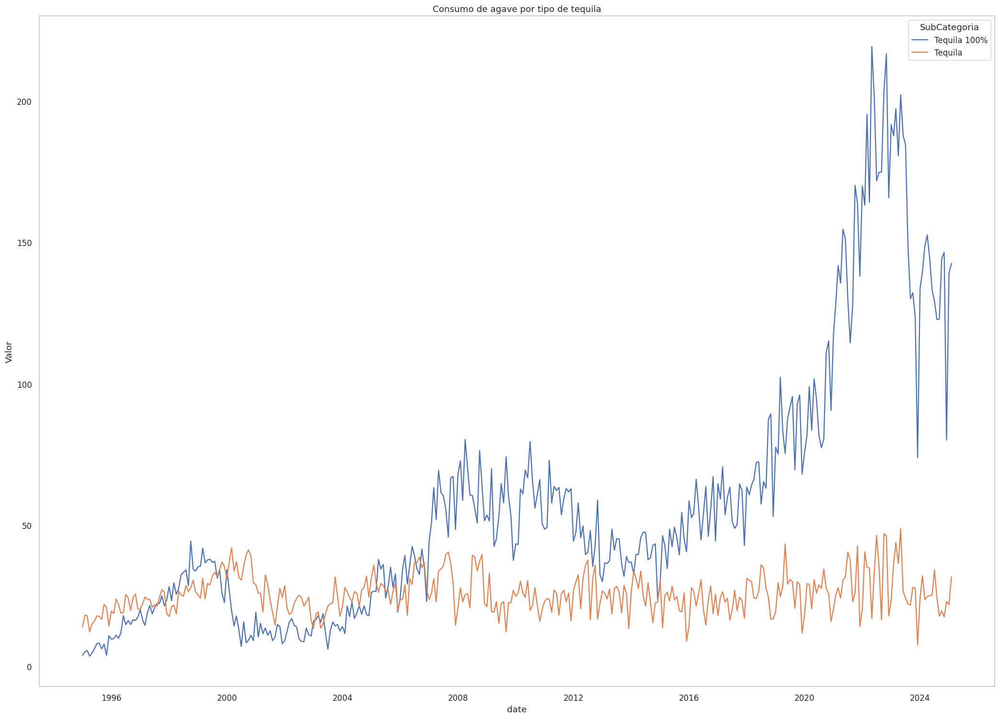

In [32]:
consumo_agave_df = pd.read_csv(BASE_PATH / "consolidado_consumodeagavetotal.csv")

consumo_agave_df["date"] = consumo_agave_df["Year"].astype(str) + "-" + consumo_agave_df["Mes"].astype(str) + "-1"
consumo_agave_df["date"] = consumo_agave_df["date"].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d'))
consumo_agave_df["month"] = consumo_agave_df["date"].map(lambda x: x.strftime("%b"))
dfWithoutTotals = consumo_agave_df[consumo_agave_df["SubCategoria"] != "Total"]

plt.figure(figsize=(11.7 * 2, 8.27 * 2))
plt.title('Consumo de agave por tipo de tequila')

ax =  sns.lineplot(data=dfWithoutTotals, x="date", y="Valor", hue="SubCategoria")
loc = mdates.AutoDateLocator()
ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
ax.grid()


## Consumo de Agave y Producción de Tequila

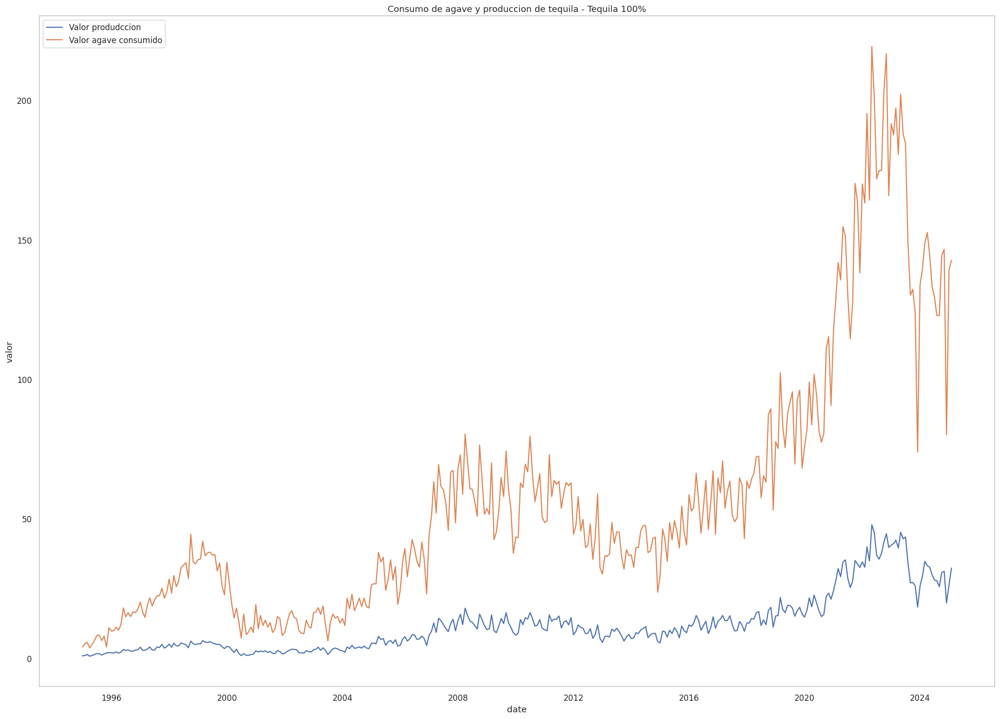

In [33]:
df_produccion = pd.read_csv(BASE_PATH / "../data/consolidado_producciontotaltequila.csv")
consumo_agave_df = pd.read_csv(BASE_PATH / "../data/consolidado_consumodeagavetotal.csv")

df_produccion["date"] = df_produccion["Year"].astype(str) + "-" + df_produccion["Mes"].astype(str) + "-1"
df_produccion["date"] = df_produccion["date"].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d')) # pd.to_datetime(df_produccion["date"], format='%Y-%m-%d')


consumo_agave_df["date"] = consumo_agave_df["Year"].astype(str) + "-" + consumo_agave_df["Mes"].astype(str) + "-1"
consumo_agave_df["date"] = consumo_agave_df["date"].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d')) # pd.to_datetime(df_produccion["date"], format='%Y-%m-%d')

df_produccion["key"] = df_produccion["date"].astype(str) + "-" + df_produccion["SubCategoria"]
consumo_agave_df["key"] = consumo_agave_df["date"].astype(str) + "-" + consumo_agave_df["SubCategoria"]

df_prod_consumo = df_produccion.merge(
    consumo_agave_df, on="key", suffixes=("_prod", "_agave")
)

df_prod_consumo = df_prod_consumo.drop(
    axis=1,
    labels=[
        "key",
        "Year_agave",
        "SubCategoria_agave",
        "AñoArchivo_agave",
        "Mes_agave",
        "date_agave",
        'AñoArchivo_prod'
    ],
)

df_prod_consumo = df_prod_consumo.rename(
    columns={"SubCategoria_prod": "SubCategoria", "Year_prod": "Year", "Mes_prod": "Mes", "date_prod":"date"}
)


dfWithoutTotals = df_prod_consumo[df_prod_consumo["SubCategoria"] != "Total"]
dfWithoutTotals = dfWithoutTotals[dfWithoutTotals["SubCategoria"] == "Tequila 100%"]

plt.figure(figsize=(11.7 * 2, 8.27 * 2))

# Plot the lines
plt.plot(dfWithoutTotals["date"], dfWithoutTotals["Valor_prod"], label='Valor produdccion')
plt.plot(dfWithoutTotals["date"], dfWithoutTotals["Valor_agave"], label='Valor agave consumido')

# Add labels and title
plt.xlabel('date')
plt.ylabel('valor')
plt.title('Consumo de agave y produccion de tequila - Tequila 100%')
plt.legend()  # Add a legend to distinguish the lines


loc = mdates.AutoDateLocator()
ax = plt.gca()
ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
ax.grid()
# axes[i, j].xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
# axes[i, j].grid()

# Show the plot
plt.show()

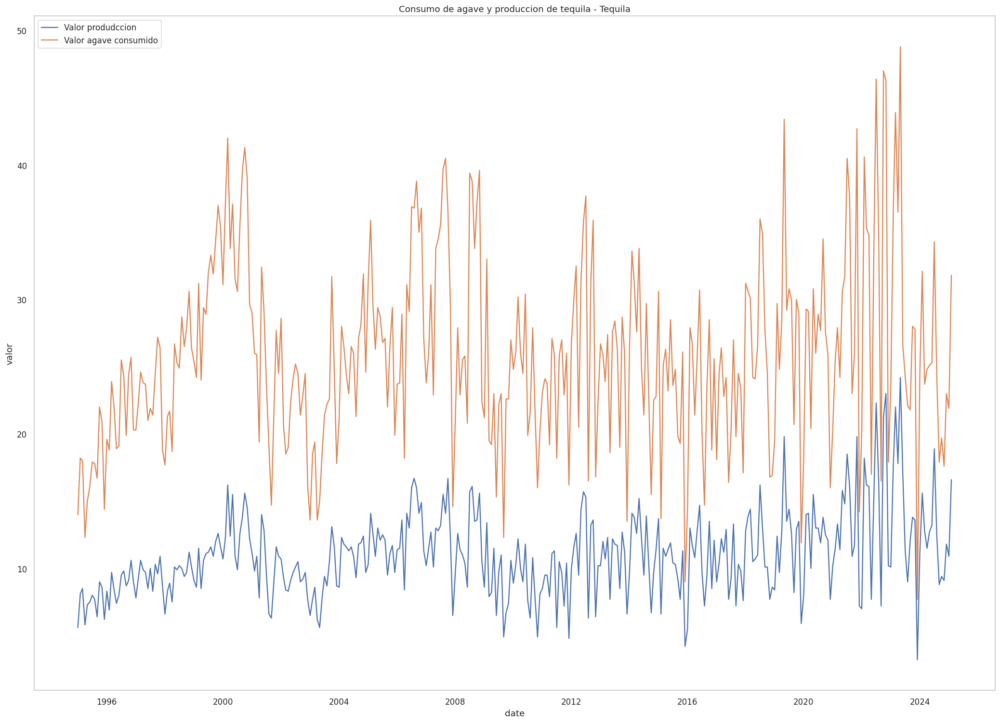

In [34]:
dfWithoutTotals = df_prod_consumo[df_prod_consumo["SubCategoria"] != "Total"]
dfWithoutTotals = dfWithoutTotals[dfWithoutTotals["SubCategoria"] == "Tequila"]

plt.figure(figsize=(11.7 * 2, 8.27 * 2))

# Plot the lines
plt.plot(dfWithoutTotals["date"], dfWithoutTotals["Valor_prod"], label='Valor produdccion')
plt.plot(dfWithoutTotals["date"], dfWithoutTotals["Valor_agave"], label='Valor agave consumido')

# Add labels and title
plt.xlabel('date')
plt.ylabel('valor')
plt.title('Consumo de agave y produccion de tequila - Tequila')
plt.legend()  # Add a legend to distinguish the lines


loc = mdates.AutoDateLocator()
ax = plt.gca()
ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
ax.grid()

# Show the plot
plt.show()

## Exportaciones por forma

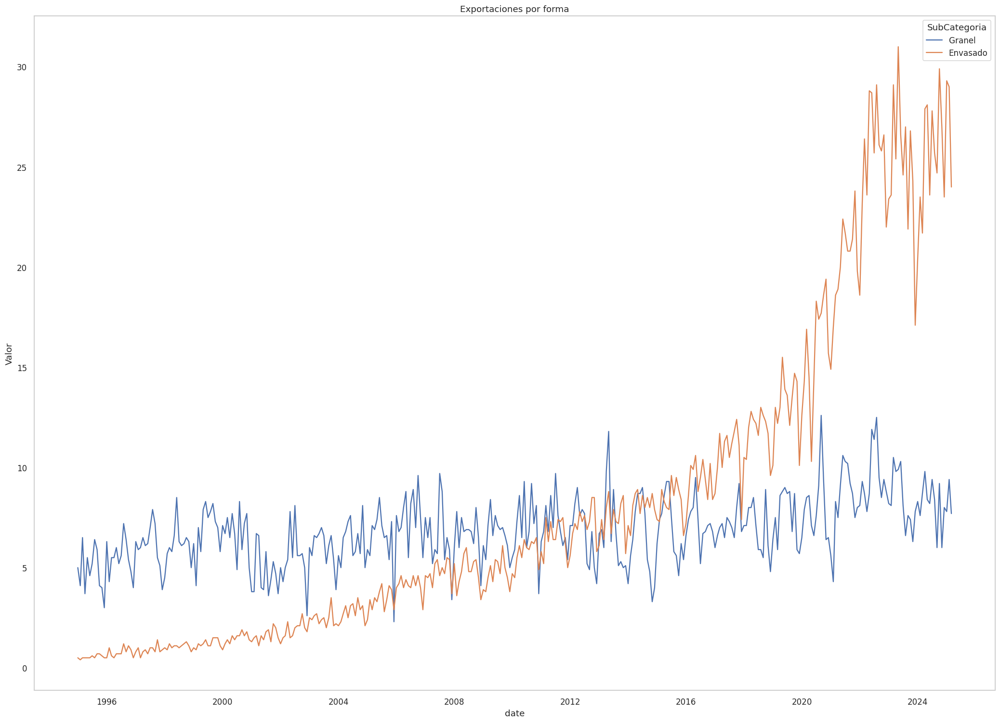

In [35]:
exportaciones_df = pd.read_csv(BASE_PATH / "../data/consolidado_exportacionestotalforma.csv")


exportaciones_df["date"] = exportaciones_df["Year"].astype(str) + "-" + exportaciones_df["Mes"].astype(str) + "-1"
exportaciones_df["date"] = exportaciones_df["date"].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d'))


plt.figure(figsize=(11.7 * 2, 8.27 * 2))
plt.title('Exportaciones por forma')

loc = mdates.AutoDateLocator()
ax = sns.lineplot(data=exportaciones_df[exportaciones_df["SubCategoria"] != "Total"], x="date", y="Valor", hue="SubCategoria")
ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(loc))
ax.grid()


## Producción vs Consumo del Tequila

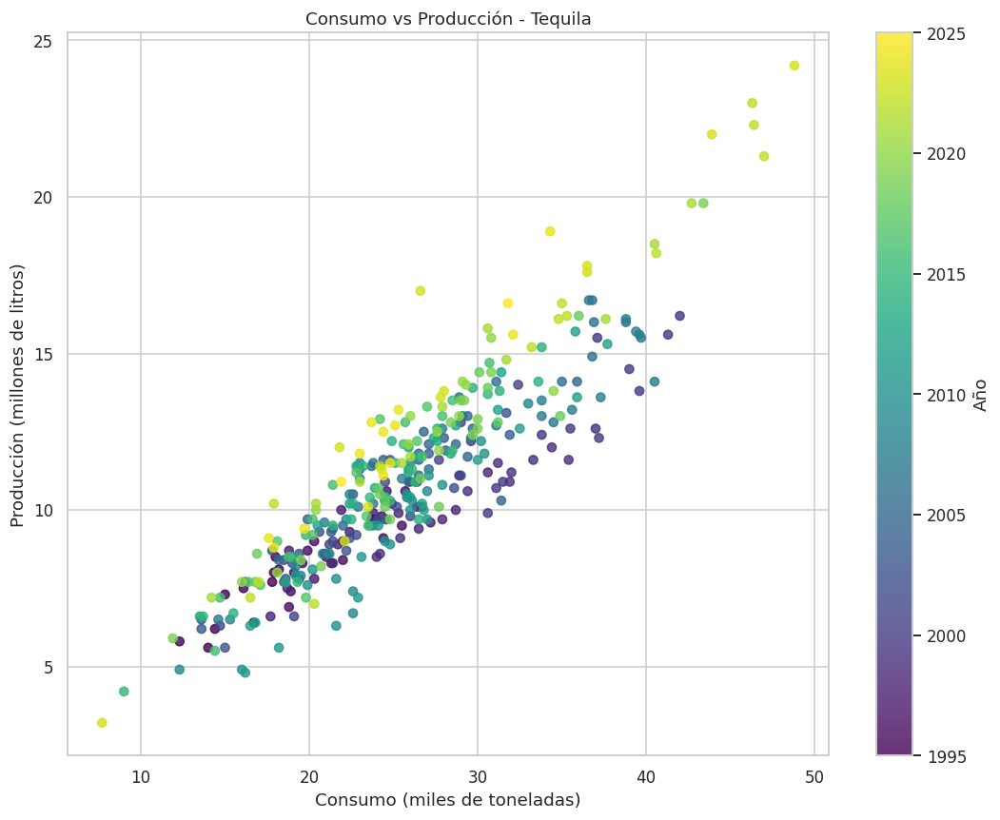

In [36]:
# Filtrar por categoría "Tequila"
df_tequila = df_prod_consumo[df_prod_consumo["SubCategoria"] == "Tequila"]

# Crear gráfico de dispersión
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    df_tequila["Valor_agave"],
    df_tequila["Valor_prod"],
    c=df_tequila["Year"],
    cmap="viridis",
    alpha=0.8,
    vmin=df_prod_consumo["Year"].min(),
    vmax=df_prod_consumo["Year"].max()
)

# Etiquetas y barra de color
plt.xlabel("Consumo (miles de toneladas)")
plt.ylabel("Producción (millones de litros)")
plt.title("Consumo vs Producción - Tequila")
cbar = plt.colorbar(scatter)
cbar.set_label("Año")
plt.grid(True)
plt.tight_layout()
plt.show()

# 2. Reporte del EDA

--------------------------------------
Índice
-----

[Liga Google Colab](#_Toc197275897)

[Repositorio GitHub](#_Toc197275898)

[Introducción](#_Toc197275899)

[Exploración de datos](#_Toc197275900)

[¿Como fueron obtenidos los datos?](#_Toc197275901)

[¿Propiedades encontradas para analizar?](#_Toc197275902)

[a. Consumo de agave y producción totales del tequila](#_Toc197275903)

[b. Exportaciones por país](#_Toc197275904)

[c. Exportaciones Total de Forma](#_Toc197275905)

[d. Total de Exportaciones Categoría](#_Toc197275906)

[Preprocesamiento](#_Toc197275907)

[Corrección de nulos](#_Toc197275908)

[Reducción de cardinalidad](#_Toc197275909)

[Borrado de datos innecesarios](#_Toc197275910)

[Descubrimientos](#_Toc197275911)

[Valores faltantes / ausencia](#_Toc197275912)

[Correlaciones](#_Toc197275913)

[Valores atípicos](#_Toc197275914)

[Tendencias temporales](#_Toc197275915)

[a. Exportaciones Total de Forma](#_Toc197275916)

[b. Total de Exportaciones Categoría](#_Toc197275917)

[c. Producción Total](#_Toc197275918)

[d. Consumo de Agave Total](#_Toc197275919)

[e. Exportaciones por País](#_Toc197275920)

[Desequilibrios](#_Toc197275921)

[Conclusión](#_Toc197275922)

--------------------------------------

# **Liga Google Colab**

<https://colab.research.google.com/drive/1Mswc86ZaltoDcGeR6p-8dvFIXLlkZhSl?usp=chrome_ntp>

# **Repositorio GitHub**

Repositorio: <https://github.com/FranciscoEnriquez/Proyecto-Modelo-de-Pronostico-de-Exportaciones>

Notebook con EDA: <https://github.com/FranciscoEnriquez/Proyecto-Modelo-de-Pronostico-de-Exportaciones/blob/main/notebook/eda.ipynb>

# **Introducción**

En este proyecto se tiene como objetivo analizar los datos públicos de la Cámara Nacional de la Industria Tequilera (CNIT) para obtener un modelo de proyección de exportaciones y un segundo modelo para la proyección del consumo de agave.

En este avance se abordará todo lo relacionado a nuestras actividades de exploración de datos, tal como el diccionario, estadísticas de nuestros datos, frecuencia en nuestras variables categóricas, correlaciones, etc.

También se abarcará el preprocesamiento de nuestros datos, los descubrimientos obtenidos durante esta exploración y se presentarán las conclusiones.

# **Exploración de datos**

## ¿Como fueron obtenidos los datos?

Los datos fueron obtenidos mediante los reportes públicos de la misma Cámara Nacional de la Industria Tequilera en el siguiente enlace: <https://old.crt.org.mx/EstadisticasCRTweb/>

Se hizo un programa el cual ejecuta un web scrapping de estos reportes para obtener los conjuntos de datos necesarios para nuestro trabajo, dichos conjuntos de datos siendo los siguientes:

1. Consumo de agave total
2. Exportaciones por país
3. Exportaciones totales por categoría
4. Exportaciones totales por forma
5. Producción total de tequila.

## ¿Propiedades encontradas para analizar?

En esta sección se abodarán los datos disponibles en cada uno de los conjuntos de datos, sin embargo, todos los conjuntos de datos tienen en común con que son “series de tiempo” que el negocio va a actualizando su registro el día 8 de cada mes.

En general la variable objetivo siempre será el Valor que se intentará predecir en entregas futuras.

### Consumo de agave y producción totales del tequila

En este conjunto de datos se cuenta con una matriz de 724 registros/filas y 5 columnas, de las cuales, al

| Columna | Tipo de Dato | Clasificación | Descripción |
| --- | --- | --- | --- |
| SubCategoria | object | Categórica nominal | Categoría del tequila usado para el consumo del agave (ej. Tequila 100%, Tequila). |
| Year | int64 | Numérica continua | Año del registro del consumo de agave |
| Valor | float64 | Numérica | Consumo de agave en miles de toneladas. |
| AñoArchivo | int64 | Numérica continua | Año del archivado del registro del consumo de agave |
| Mes | int64 | Numérica continua | Mes donde fue consumido |

**Tabla 1.** Diccionario de datos de consumo de agave.

De estos conjuntos de datos se obtuvieron los siguientes resúmenes descriptivos:

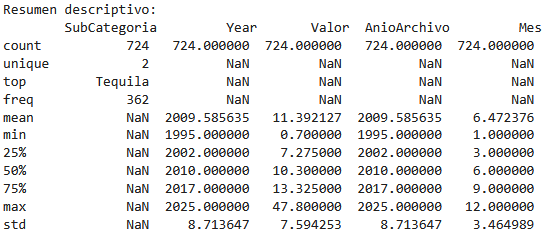

**Figura 1.** Resumen descriptivo, producción total de tequila.

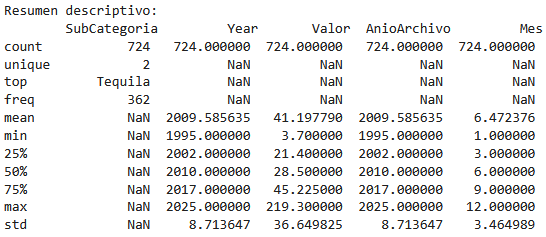

**Figura 2.** Resumen descriptivo, consumo total de agave.

### Exportaciones por país

En este conjunto de datos se cuenta con una matriz de 64281 registros/filas y 9 columnas.

| Columna | Tipo de Dato | Clasificación | Descripción |
| --- | --- | --- | --- |
| NombrePais | object | Categórica nominal | Nombre del país al que se exporta el producto. |
| Total_Pais_Mes | float64 | Numérica continua | Valor monetario mensual total por país. |
| Categoria | object | Categórica nominal | Categoría del producto exportado. |
| Total_Categoria_Mes | float64 | Numérica continua | Valor monetario mensual total por categoría. |
| Clase | object | Categórica ordinal | Tipo o maduración del producto (ej. Blanco, Joven, Reposado, Añejo, Extra añejo). |
| Litros 40 % Alc. Vol | float64 | (sin clasificar) | Volumen de exportación por millones de litros |
| AñoArchivo | int64 | (sin clasificar) | Periodo-Año correspondiente a la exportación. |
| Mes | int64 | (sin clasificar) | Periodo-Mes correspondiente a la exportación. |

**Tabla 2.** Diccionario de datos de exportaciones por país.

De este conjunto de datos se obtuvieron los siguientes resúmenes descriptivos:

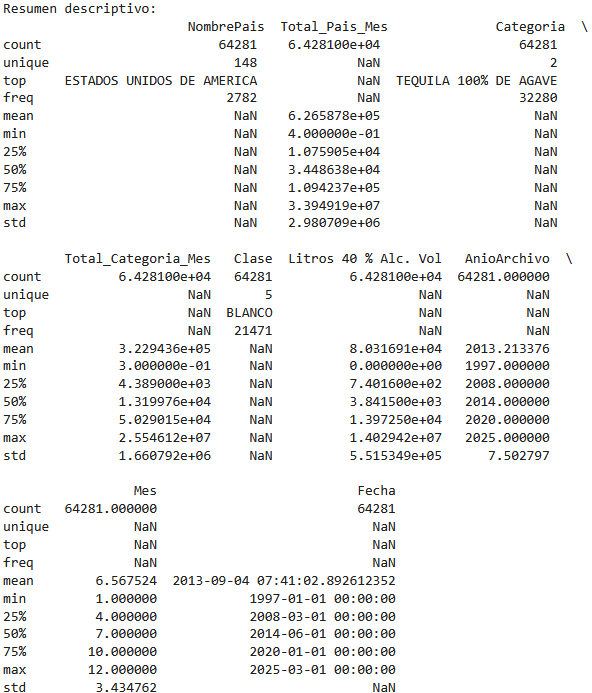

**Figura 3.** Resumen descriptivo de exportaciones por país.

Este conjunto de datos, como se puede ver, presenta una alta cardinalidad comparada a otros conjuntos de datos a trabajar para este proyecto.

| Cardinalidad |   #  |
| --- | --- |
| NombrePais | 148 |
| Categoria | 2   |
| Clase | 5   |

**Tabla 3.** Cardinalidad de exportaciones por país.

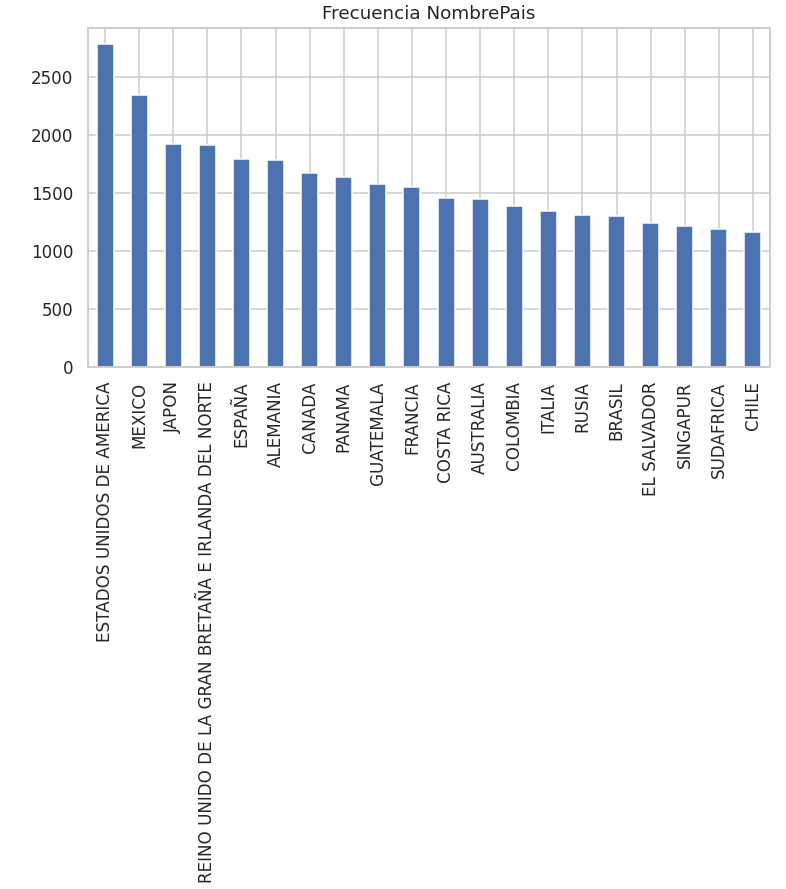

**Figura 4.** Frecuencia de valores en “NombrePaís” en exportaciones por país.

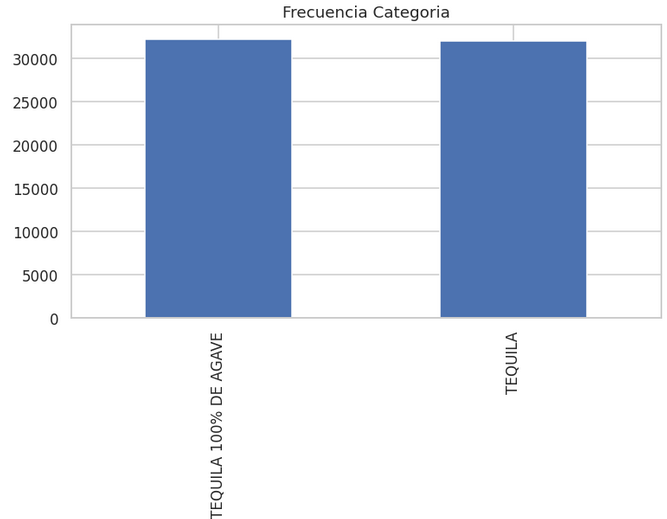

**Figura 5.** Frecuencia de valores en “Categoría” en exportaciones por país.

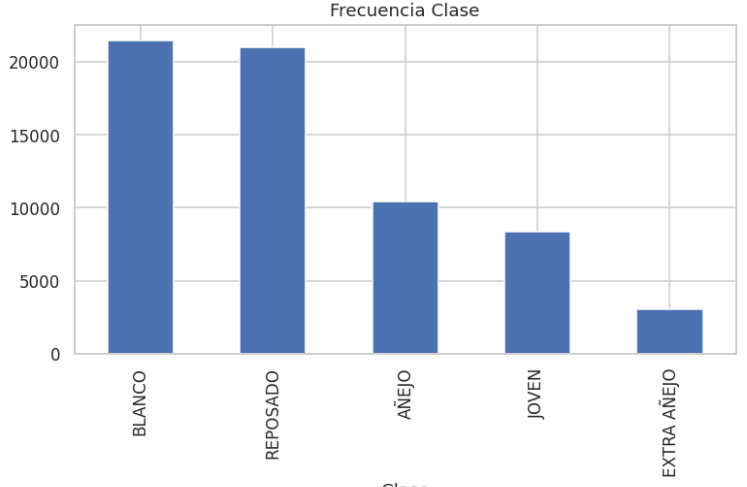

**Figura 6.** Frecuencia de valores en “Clase” en exportaciones por país.

### Exportaciones Total de Forma

En este conjunto de datos se cuenta con una matriz de 726 registros/filas y 6 columnas.

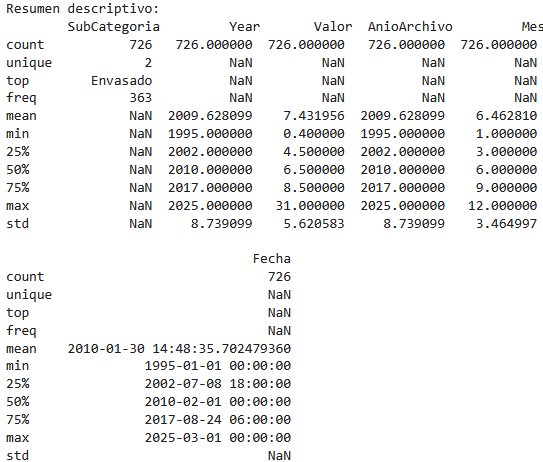

**Figura 7.** Resumen descriptivo de exportaciones totales por forma.

| Columna | Tipo de Dato | Clasificación | Descripción |
| --- | --- | --- | --- |
| SubCategoria | object | Categórica nominal | Categoría del tequila usado para el consumo del agave (ej. Tequila 100%, Tequila). |
| Year | int64 | Numérica continua | Año del registro de la exportación. |
| Valor | float64 | Numérica | Exportación en millones de litros. |
| AñoArchivo | int64 | Numérica continua | Año del archivado del registro de la exportación. |
| Mes | int64 | Numérica continua | Mes donde fue exportado. |

**Tabla 4.** Diccionario de datos de exportaciones por forma.

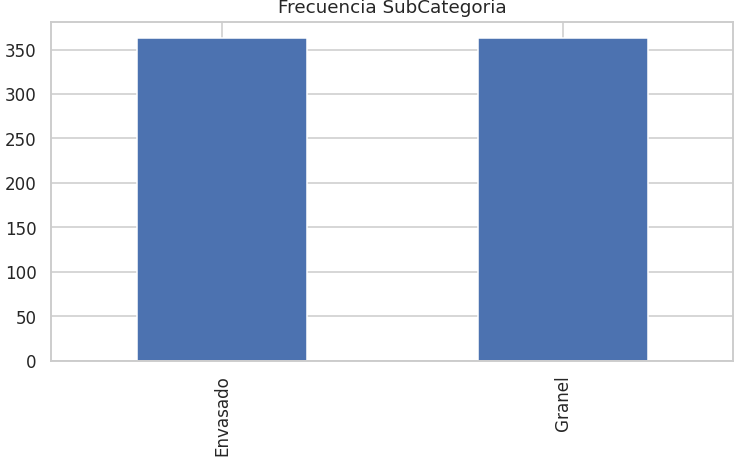

**Figura 8.** Frecuencia de valores de “Subcategoría” en exportación por forma.

### Total de Exportaciones Categoría

En este conjunto de datos se cuenta con una matriz de 726 registros/filas y 6 columnas.

| Columna | Tipo de Dato | Clasificación | Descripción |
| --- | --- | --- | --- |
| SubCategoria | object | Categórica nominal | Categoría del tequila usado para el consumo del agave (ej. Tequila 100%, Tequila). |
| Year | int64 | Numérica continua | Año del registro de la exportación. |
| Valor | float64 | Numérica | Exportación en millones de litros. |
| AñoArchivo | int64 | Numérica continua | Año del archivado del registro de la exportación. |
| Mes | int64 | Numérica continua | Mes donde fue exportado. |
| Fecha | Date | Fecha | Fecha de exportación. |

**Tabla 5.** Diccionario de datos de exportaciones totales por categoría.

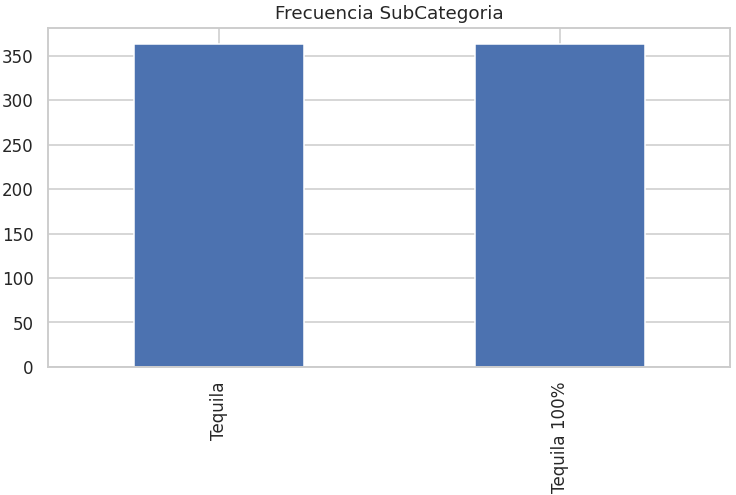

**Figura 9.** Frecuencia de clases en subcategoría, exportación total por categoría.

# Preprocesamiento

## Corrección de nulos

En los diferentes conjuntos de datos no se encontró ningún valor faltante, sin embargo, se agregó al pipeline de preprocesamiento un paso para la corrección de nulos en caso de que esto se llegase a presentar en algún futuro.

Winsorización de valores atípicos

Otro de los pasos del preprocesamiento realizado es la Winsorización, una transformación de datos a las columnas numéricas que estén fuera del 1.5 rango intercuartílico, pero se hace omisión de esta transformación en el caso de “Year”, “Mes” y “AnioArchivo” debido a que estos datos a pesar de ser numéricos categóricos, no son cantidades.

## Reducción de cardinalidad

En la gran mayoría de los conjuntos de datos se encontró que se tiene una baja cardinalidad en los valores categóricos. Sin embargo, se encontró que, en el conjunto de datos de exportaciones por país, la columna de “NombrePais” presenta una cardinalidad más alta comparado el resto de los valores categóricos.

Para reducir la cardinalidad se agrupan varios países con una frecuencia baja a un solo valor determinado como “OTROS”.

## Corrección de sesgo

Debido a que las cantidades manejadas en estos conjuntos de datos presentan valores demasiado grandes, se procede a corregir el sesgo de las columnas con datos numéricos si presentan un sesgo mayor a 1 y si es así se le aplica la fórmula de logaritmo base 10 para disminuir el sesgo.

## Borrado de datos innecesarios

En los distintos conjuntos de datos donde se usan las subcategorías o categorías del tequila s encuentran frecuentemente en los datos los valores de “Tequila 100% de Agave”, “Tequila”, “Total”.

El valor de Total es la suma de los valores de Tequila 100% y Tequila por lo cual no sirve de alguna manera analizar estos valores que son superfluos.

# Descubrimientos

## Valores faltantes / ausencia

Los conjuntos de datos “Total Exportaciones Forma”, “Total de Exportaciones Categoría”, “Producción Total Tequila”, “Consumo de Agave”, “Exportaciones País”, **no presentaron valores faltantes** en todos sus atributos.

1. Exportaciones Total Forma

| **Columna** | **% Nulos** |
| --- | --- |
| SubCategoria | 0%  |
| Year | 0%  |
| Valor | 0%  |
| AnioArchivo | 0%  |
| Mes | 0%  |
| Fecha | 0%  |

**Tabla 6.** Porcentaje de valores nulos.

1. Total de Exportaciones Categoría

| **Columna** | **% Nulos** |
| --- | --- |
| SubCategoria | 0%  |
| Year | 0%  |
| Valor | 0%  |
| AnioArchivo | 0%  |
| Mes | 0%  |
| Fecha | 0%  |

**Tabla 7.** Porcentaje de valores nulos.

1. Producción Total

| **Columna** | **% Nulos** |
| --- | --- |
| SubCategoria | 0%  |
| Year | 0%  |
| Valor | 0%  |
| AnioArchivo | 0%  |
| Mes | 0%  |
| Fecha | 0%  |

**Tabla 8.** Porcentaje de valores nulos.

1. Consumo de Agave Total

| **Columna** | **% Nulos** |
| --- | --- |
| SubCategoria | 0%  |
| Year | 0%  |
| Valor | 0%  |
| AnioArchivo | 0%  |
| Mes | 0%  |
| Fecha | 0%  |

**Tabla 9.** Porcentaje de valores nulos.

1. Exportaciones por País

| **Columna** | **% Nulos** |
| --- | --- |
| NombrePais | 0%  |
| Total_Pais_Mes | 0%  |
| Categoria | 0%  |
| Total_Categoria_Mes | 0%  |
| Clase | 0%  |
| Litros 40 % Alc. Vol | 0%  |
| AnioArchivo | 0%  |
| Mes | 0%  |
| Fecha | 0%  |

**Tabla 10.** Porcentaje de valores nulos.

## Correlaciones

1. Exportaciones Total Forma

La máxima correlación en las variables numéricas se encuentra entre “Valor” y “Year” (0.72).

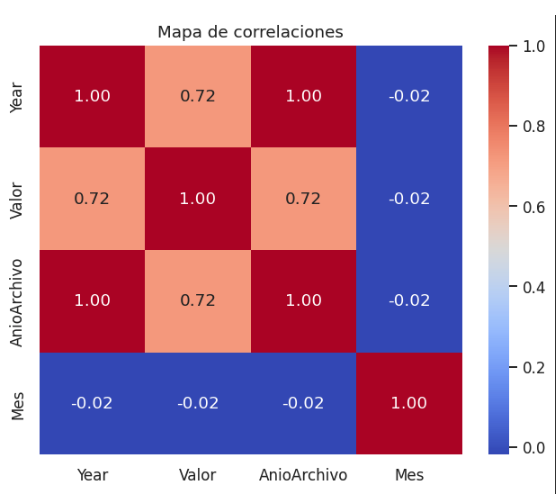

**Figura 10.** Mapa de calor, correlaciones de valores.

1. Total de Exportaciones Categoría

Tampoco se encontraron discrepancias para este dataset, pues las variables numéricas son las mismas, pero diferenciando la categoría: siendo la máxima correlación en las variables numéricas se encuentra entre “Valor” y “Year” (0.72).

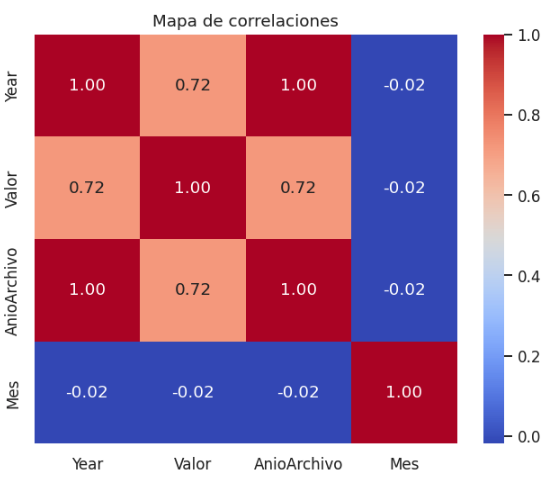

**Figura 11.** Mapa de calor, correlaciones de valores.

1. Producción Total

En la producción Total, las variables con mayor correlación son entre las variables numéricas se encuentra entre “Valor” y “Year” (0.62).

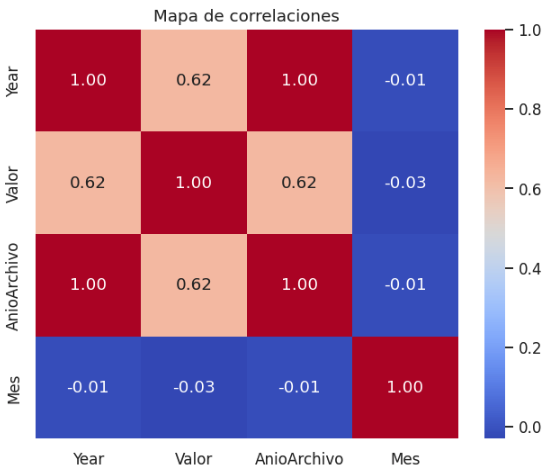

**Figura 11.** Mapa de calor, correlaciones de valores.

1. Consumo de Agave Total

Las variables con mayor correlación son entre las variables numéricas se encuentra entre “Valor” y “Year” (0.52).

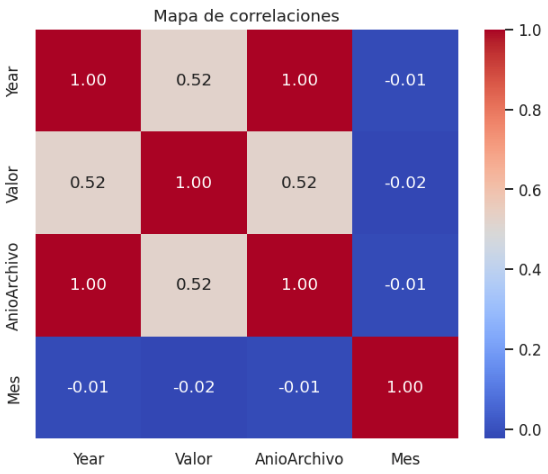

**Figura 12.** Mapa de calor, correlaciones de valores.

1. Exportaciones por País

Existen dos conjuntos de variables con correlación positiva:

- Total de Categoría mes y el Total país mes: 0.93.
- Total de Categoría mes y el Litros 40% vol. Alcohol : 0.66.

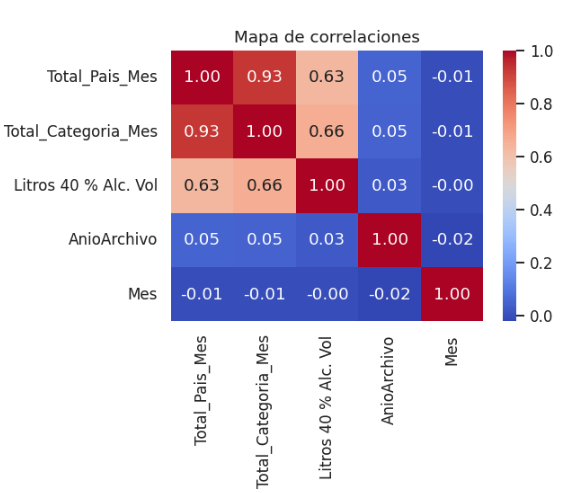

**Figura 13.** Mapa de calor, correlaciones de valores.

## Valores atípicos

1. Exportaciones Total de Forma

El histograma correspondiente a la variable “Valor” tiene un **sesgo a la derecha** (asimétrica positiva); concentrando la mayor parte de los puntos entre los valores 3 y 10. Sin embargo, el boxplot ayuda a identificar valores extremos considerados como outliers superiores al valor de 14.5. La mediana es en torno al valor 6.5 lo que corresponde a la distribución.

**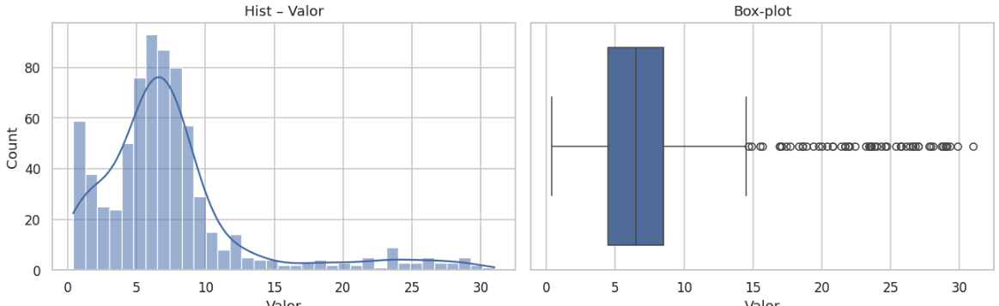Figura 14.** Distribución de la variable “valor” (izquierda) y boxplot (derecha) para el conjunto de datos “Exportaciones Total de Forma”.

1. Total de Exportaciones Categoría

La distribución también presenta un sesgo a la derecha para la variable “valor”, con una concentración de los valores entre los puntos 5 y 10. La mediana mostrada en el diagrama boxplot está cerca del valor 6.5; también existen valores atípicos, pero con una cardinalidad pequeña, respecto al conjunto de datos. La distribución presenta cierta simetría.

**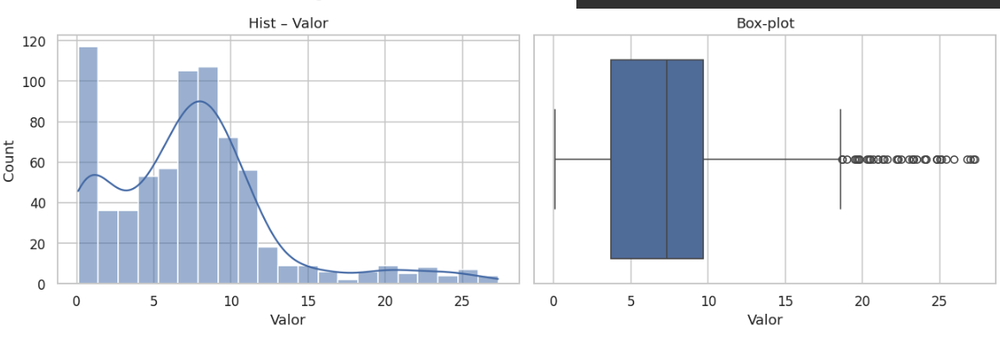Figura 15.** Distribución de la variable “valor” (izquierda) y boxplot (derecha) para el conjunto de datos “Total de Exportaciones por Categoría”.

1. Producción Total

La distribución tiene una mediana cerca al valor 10, con mayor concentración de los puntos entre el 7 y 10. El boxplot muestra la existencia de valores atípico que alcanzan el valor 48 y son un cúmulo importante de outliers. No es una distribución simétrica.

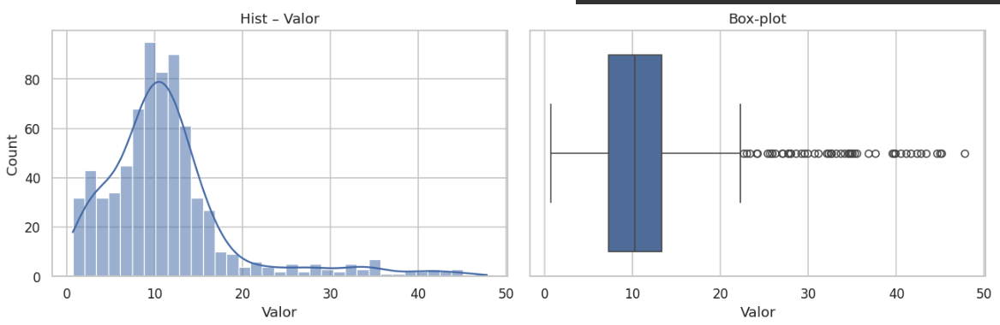

**Figura 16.** Distribución de la variable “valor” (izquierda) y boxplot (derecha) para el conjunto de datos “Producción Total”.

1. Consumo de Agave Total

La distribución muestra un sesgo a la derecha (asimetría positiva), los valores están centrados alrededor del punto 30, y la mayor parte de ellos se encuentra entre los puntos 20 y 40. Existen valores atípicos superiores al punto 80 pero con extremos hasta el valor 200.

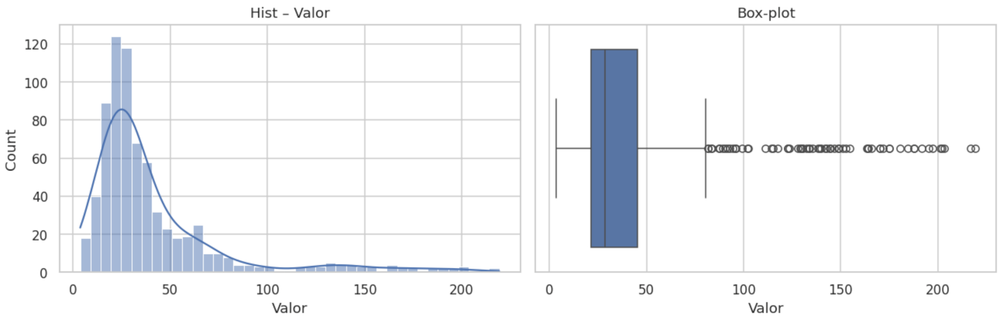

**Figura 17.** Distribución de la variable “valor” (izquierda) y boxplot (derecha) para el conjunto de datos “Consumo de Agave Total”.

1. Exportaciones por País

La distribución es sesgada a la derecha con una asimetría positiva extrema. Existen un gran volumen de ourliers dispersos. Esta es la variable con más asimetría de los 4 restantes.

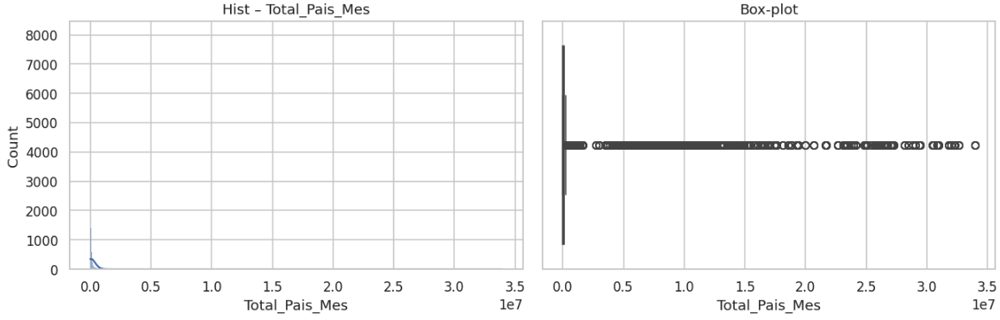

**Figura 18.** Distribución de la variable “valor” (izquierda) y boxplot (derecha) para el conjunto de datos “Exportaciones por País”.

## Tendencias temporales

### Exportaciones Total de Forma

Como se puede ver en la siguiente figura, existe una tendencia a exportar tequila envasado (línea naranja), mientras que la exportación a granel a pesar de su volatilidad tiene una tendencia de aumento más baja (línea azul). La tendencia de exportación del tequila envasado tuvo un crecimiento acelerado a partir del año 2020; el tequila a granel se mantuvo estable durante el mismo periodo.

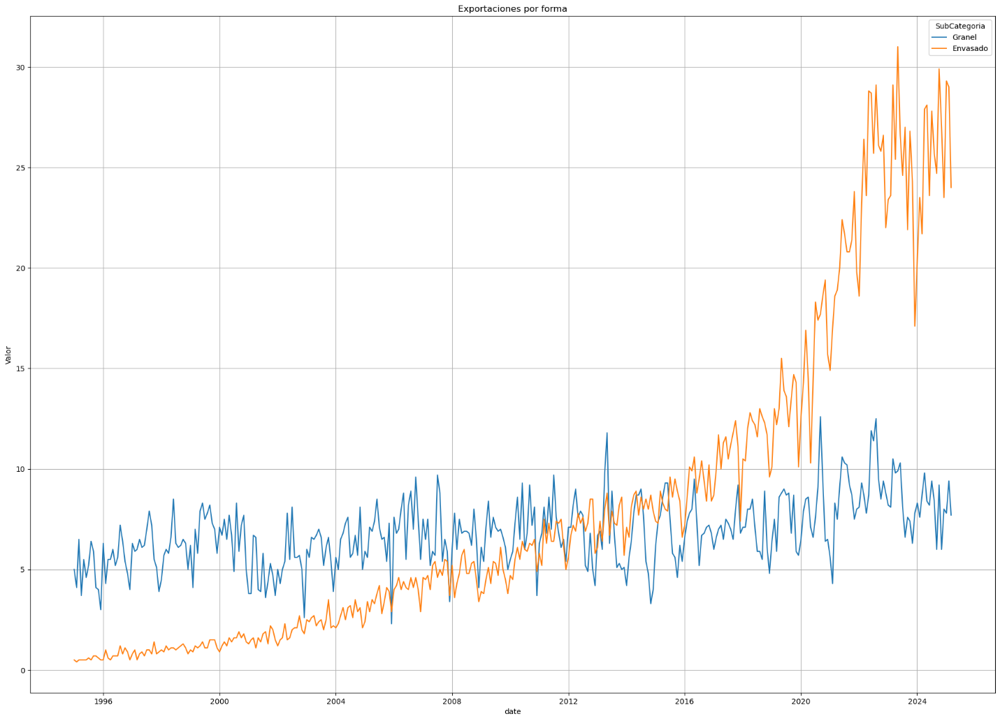

**Figura 19.** Exportaciones totales de tequila en forma, valor en millones de litros.


### Total de Exportaciones Categoría

La tendencia del tequila 100% (línea azul) es creciente de manera general, sin embargo, en el año 2000 se observa un crecimiento con mayor aceleración respecto a los periodos anteriores, dicho crecimiento acelerado parece estabilizarse posterior al año 2024.

La tendencia del Tequila (línea naranja), es creciente, pero con una aceleración mucho más lenta; existen periodos oscilantes sin crecimiento entre los años 2008 y 2020. Ambas tendencias exhiben puntos estacionales cercanos a los inicios o términos de cada año.


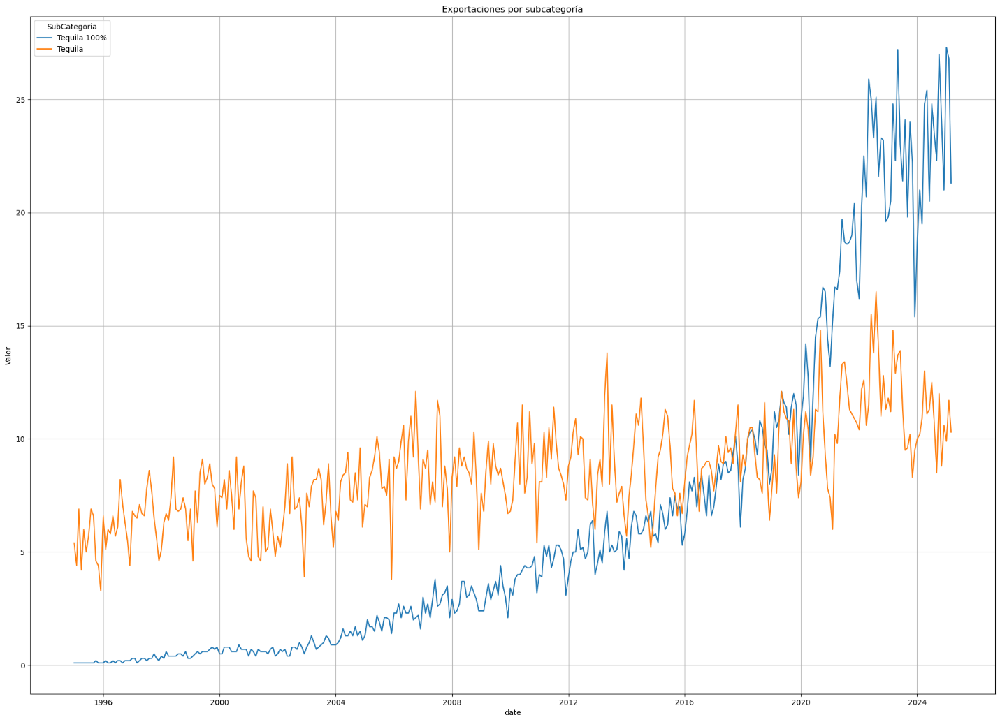

**Figura 20.** Exportaciones de tequila por subcategoría, valor en millones de litros.


### Producción Total

La tendencia de la producción del Tequila 100% (línea azul) presenta tres periodos de crecimiento marcados: desde el comienzo hasta el año 2006, posterior al 2006 y posterior al 2022 y un periodo de aceleración creciente posterior al 2022. En el periodo intermedio se muestra crecimientos oscilantes en donde el Tequila (línea naranja) supera la producción con una distancia entre puntos no tan distantes.

En el periodo inicial y final la producción del Tequila 100% respecto al Tequila siempre se encuentra por arriba. Sólo en el tercer periodo existe un despunte del Tequila 100% de dos órdenes de magnitud.


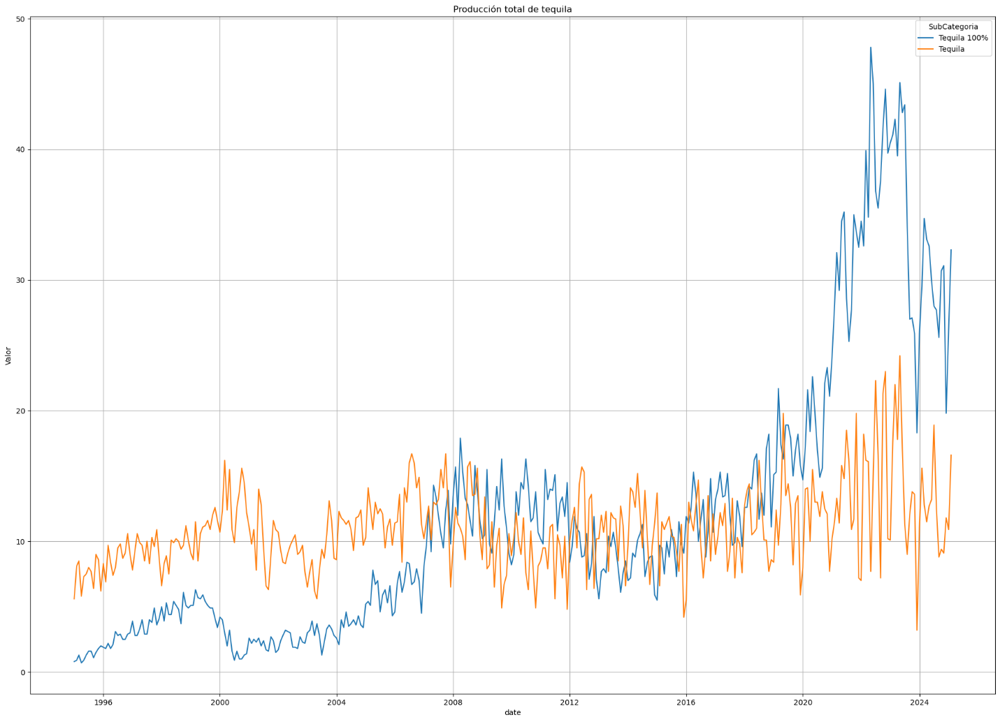

**Figura 21.** Producción total de tequila, valor en millones de litros.


### Consumo de Agave Total

La tendencia del consumo de agave Tequila 100% (línea azul, figura 22) tiene periodos oscilantes con punto de inflexión (marcos punteados verdes) que tienen cierta temporalidad. Después del año 2022 existe un crecimiento acelerado en el consumo del agave, sin embargo, también tiene un punto de inflexión mostrando crestas y valles. La tendencia del consumo de agave Tequila (línea naranja), muestra una estabilidad oscilante, pero siempre acotada por una franja de consumo (marco morado)

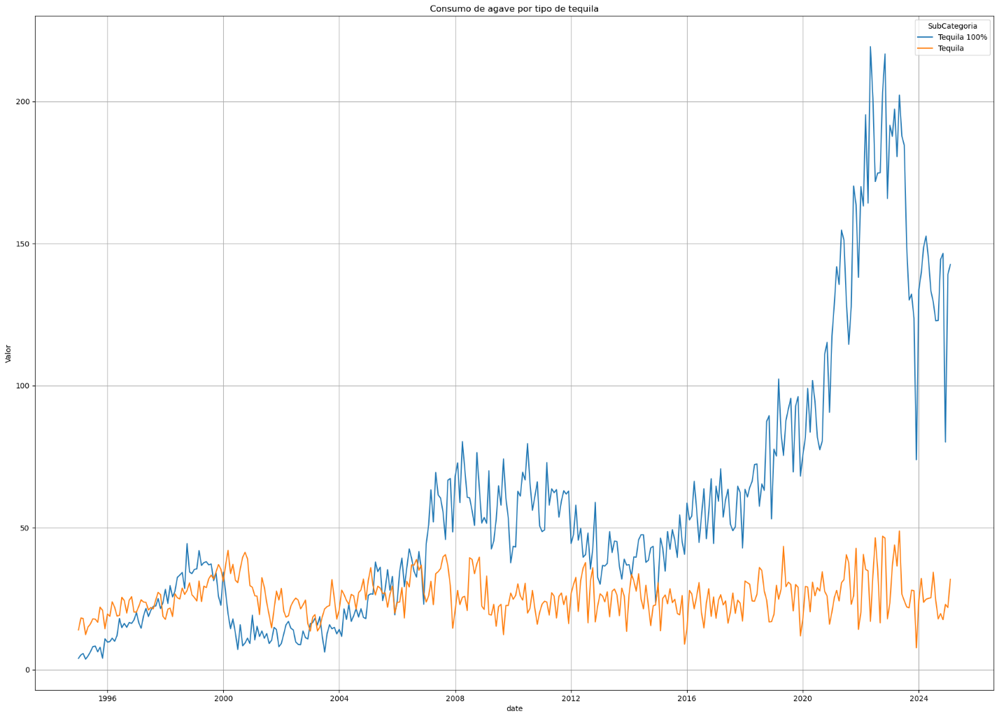

**Figura 22.** Consumo de agave por producción de tequila.


Las tendencias del consumo de agave (línea naranja) versus producción (línea azul) del Tequila 100%, se muestran en la figura 23; existe cierta estacionalidad en el desarrollo de ambas tendencias de manera sincronizada en periodos semejantes. Sin embargo, hay un periodo disruptivo a partir del año 2020 en donde el consumo muestra un crecimiento acelerado, con tres órdenes de magnitud respecto a la tendencia de producción, la estacionalidad aún está presente en ambas líneas de tendencia.

En la figura 24 sobre el consumo de agave versus la producción para el Tequila, se muestran ciertas estacionalidades en los mismos periodos; sin embargo, no hay puntos de inflexión en donde exista un crecimiento acelerado para ambas tendencias, lo que muestra cierta estabilidad.

Para ambos tipos de Tequila, el crecimiento sincrónico entre el consumo y la producción se visualiza en la figura 25, en donde hay cierta correlación positiva entre ambas variables.

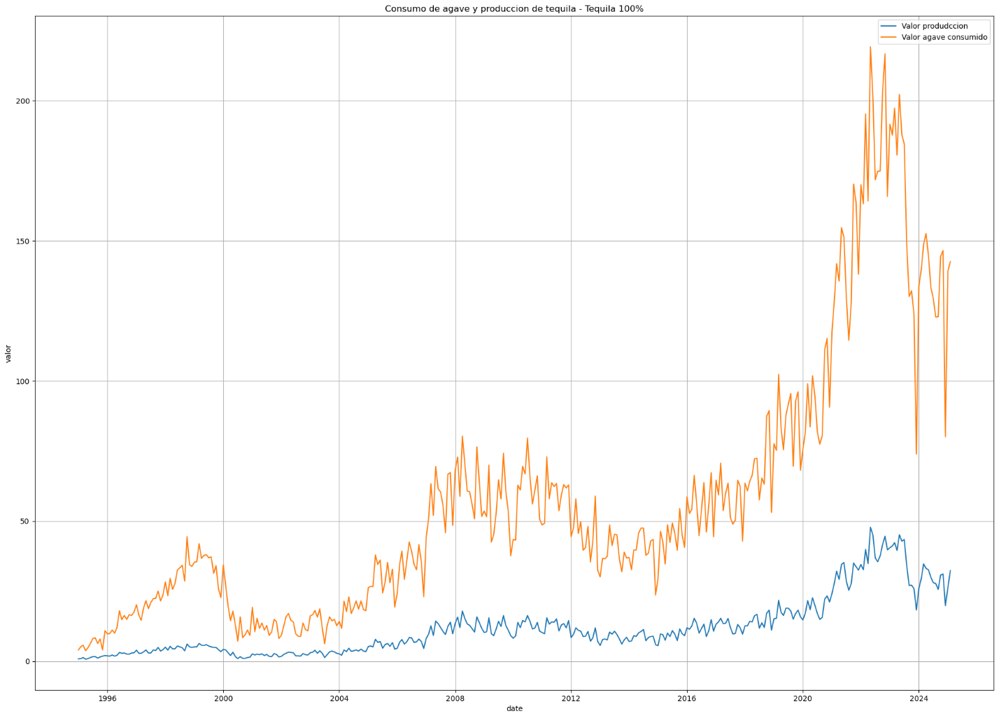

**Figura 23.** Consumo de agave y producción de tequila para Tequila 100%. Valor producción en millones de litros, valor en consumo en miles de toneladas.

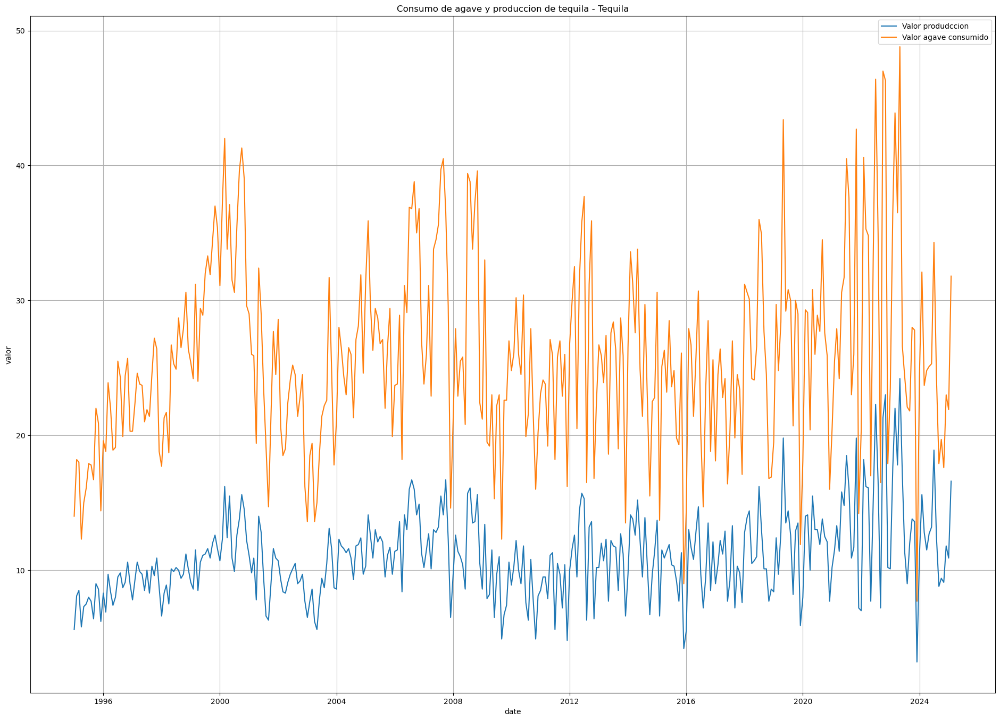

**Figura 24.** Consumo de agave y producción de tequila para Tequila. Valor producción en millones de litros, valor en consumo en miles de toneladas.

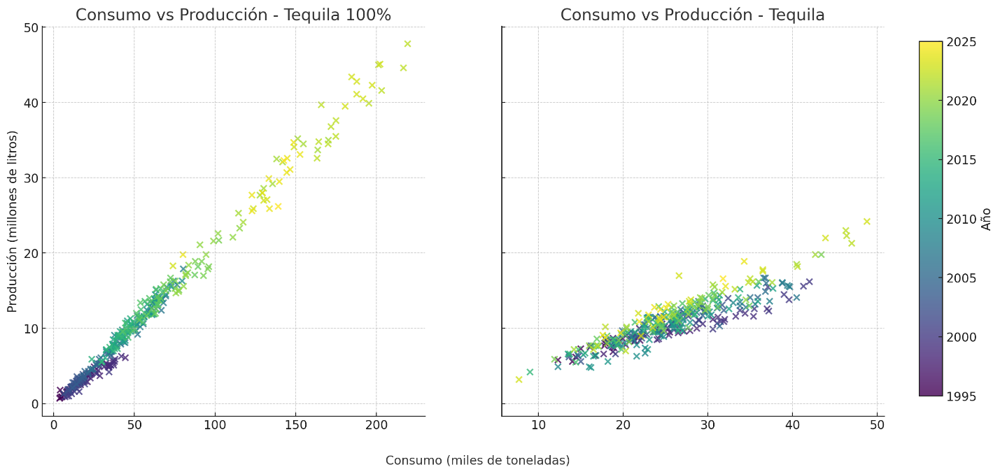

**Figura 25.** Gráfico de dispersión entre el consumo de agave y producción de tequila para Tequila 100% (izquierda) y Tequila (derecha). Valor producción en millones de litros, valor en consumo en miles de toneladas.

### Exportaciones por País

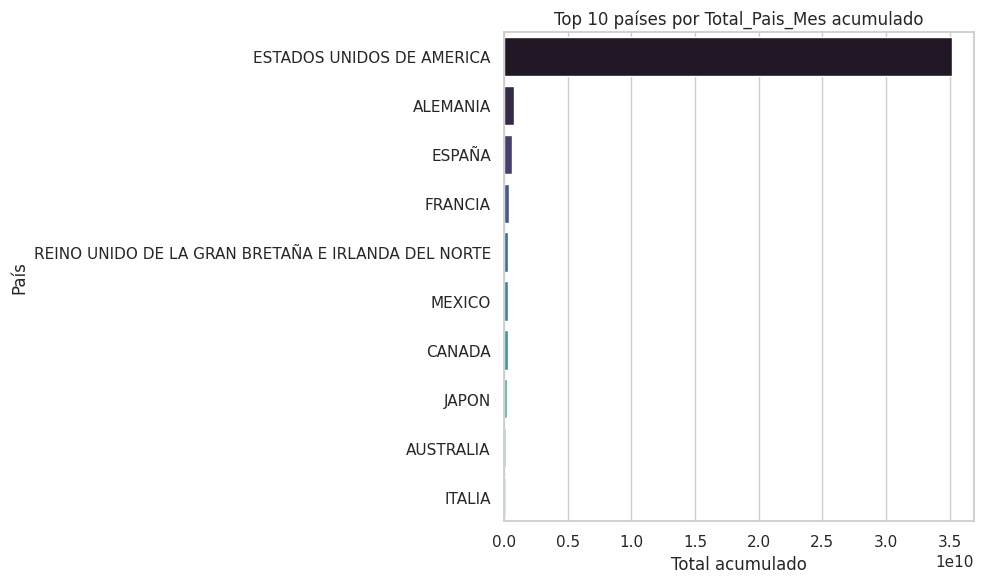

**Figura 26.** Top 10 países por total acumulado

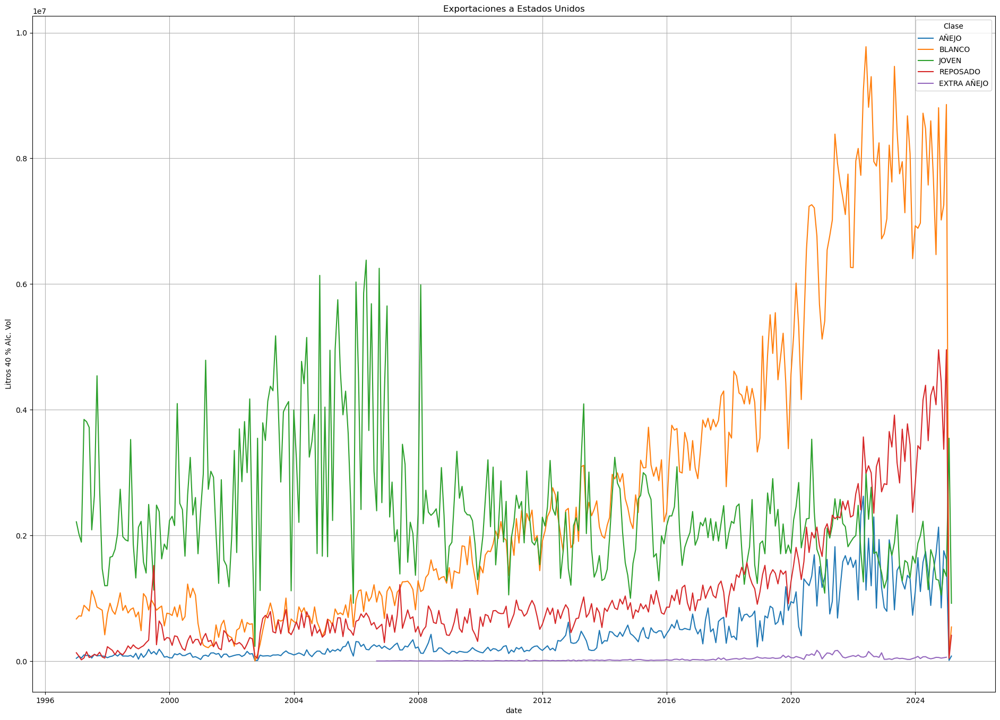

**Figura 27.** Total de tequila exportado por clase.

## Desequilibrios

Como se ha visto en gráficas pasadas, la gran mayoría de nuestras variables categóricas se encuentran balanceadas ya que en los reportes obtenidos se encuentra un registro tanto de las categorías de Tequila 100% y Tequila.

Sin embargo, se encuentra que la variable categórica con más desequilibrio es “NombrePais” donde se encuentra a Estados Unidos de América como la clase más predominante en este conjunto de datos.

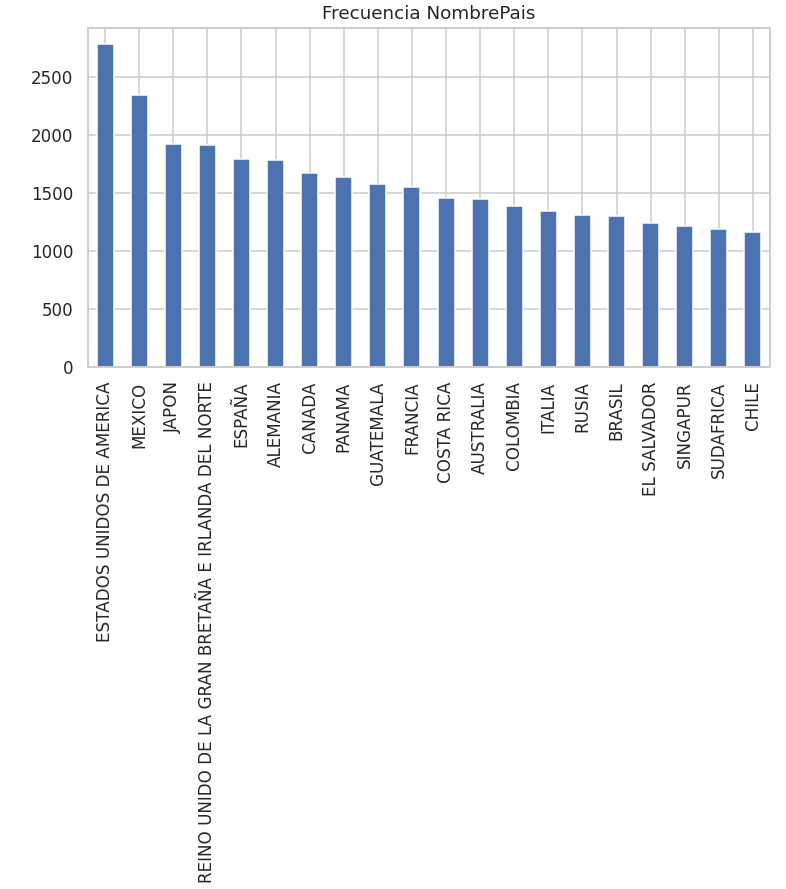

**Figura 28.** Frecuencia de valores en “NombrePais” de las exportaciones totales por país.

Otra variable categórica donde se encuentra un desequilibrio es en los valores de “Clase” en las exportaciones totales por país, donde se encuentran los diferentes tipos de tequilas exportados, aquí se puede ver que los valores Añejo, Joven y Extra añejo, lo cual en el caso de añejo y extra añejo, hace sentido debido a la cantidad de tiempo necesario para su producción.

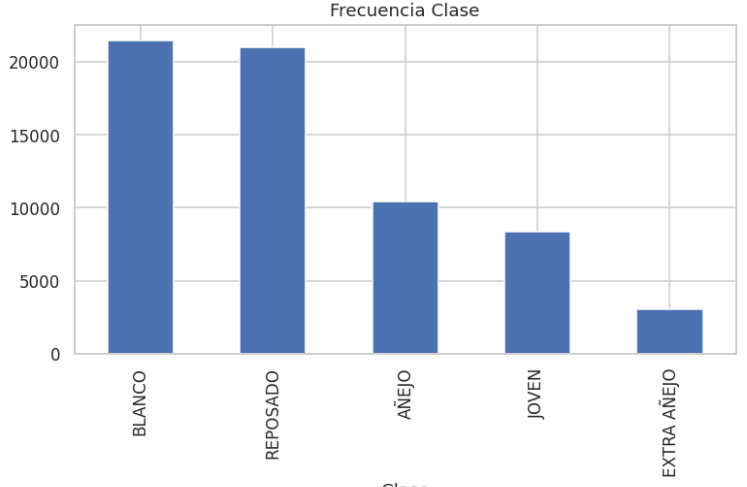

**Figura 29.** Frecuencia de valores en “Clase” de las exportaciones totales por país.

# Conclusión

El análisis exploratorio de datos (EDA) permitió obtener una visión profunda del conjunto de datos y ha revelado varios aspectos cruciales para la continuación del proyecto:

1. Ausencia de valores faltantes: No se identificaron valores nulos en el conjunto de datos, lo que facilita el proceso de modelado, ya que no será necesario realizar imputaciones de datos faltantes.
2. Desafíos del modelo de series temporales: El análisis ha revelado que el conjunto de datos está estructurado temporalmente, lo que implica que el proyecto debe abordar un problema de predicción de series de tiempo (time series forecasting). Esto obliga a considerar adecuadamente la temporalidad, la estacionalidad y las posibles tendencias a lo largo del tiempo.
3. Variable objetivo: En todos los conjuntos de datos, la variable objetivo es el "Valor", lo que hace que los modelos de regresión sean adecuados para este tipo de predicción. Esta uniformidad facilitará la comparación de resultados entre los diferentes modelos.
4. Tendencia disruptiva post-2020: Un hallazgo clave es la aceleración del crecimiento en las exportaciones y consumo de agave después del año 2020. Este periodo disruptivo será fundamental a la hora de ajustar las ventanas de tiempo para el modelo, ya que podría influir significativamente en las predicciones y debe ser considerado en la calibración del modelo.
5. Importancia de Estados Unidos en las exportaciones: El análisis mostró que Estados Unidos es el principal país receptor de las exportaciones de tequila, lo que destaca la importancia de modelar adecuadamente las exportaciones hacia este país en particular para mejorar la precisión de las predicciones.
6. Correlación significativa entre consumo de agave y producción de tequila: Se observó una fuerte correlación entre el consumo de agave y la producción de tequila, lo que sugiere que el modelo debe considerar tanto el consumo como la producción como variables clave para las predicciones de exportación.
7. Desbalance en las clases: A pesar de que el conjunto de datos muestra una distribución relativamente equilibrada, el modelo podría necesitar ajustes para manejar posibles desbalances en las clases, especialmente en términos de tipos de productos y categorías de exportación.

Con base en los hallazgos obtenidos, se puede concluir que el problema principal a resolver es la predicción de exportaciones y producción de tequila como una serie temporal. Este problema debe abordarse teniendo en cuenta las siguientes acciones:

- Enriquecimiento de los datos: Es crucial identificar variables exógenas (como factores económicos, climáticos o regulatorios) que puedan influir en las exportaciones y el consumo de agave. La inclusión de estas variables permitirá mejorar la precisión del modelo.
- Exploración de ventanas de tiempo: Será necesario definir una ventana temporal adecuada para el modelo, especialmente considerando el cambio acelerado posterior a 2020. Esto puede incluir la prueba de modelos con diferentes periodos de entrenamiento y evaluación para ajustar los parámetros del modelo.
- Consideración de tendencias y estacionalidad: Se debe incorporar la estacionalidad y las tendencias a largo plazo en el modelo de series temporales para capturar adecuadamente los patrones cíclicos y las fluctuaciones a lo largo del tiempo.

En resumen, el EDA ha proporcionado información valiosa para la ingeniería de características y la construcción del modelo predictivo, destacando áreas claves como la influencia de Estados Unidos, la correlación entre consumo y producción, y la necesidad de un enfoque adecuado de series temporales con ventanas de tiempo ajustadas.